# Galaxy Latent Diffusion Model 




## 1. Setup 

In [3]:
import os, sys, math
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from pathlib import Path
from dataclasses import dataclass, field
from typing import List, Optional
from IPython.display import clear_output

import h5py
from tqdm.notebook import tqdm

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torchvision.transforms.functional as TF
from torch.utils.data import Dataset, DataLoader
from torch.optim.lr_scheduler import CosineAnnealingLR, LinearLR, SequentialLR

project_root = os.path.abspath("../")
if project_root not in sys.path:
    sys.path.insert(0, project_root)

from src.utils import *
from src.models.ldm import *

print(f"PyTorch {torch.__version__} | "
      f"CUDA: {torch.cuda.is_available()} | "
      f"MPS: {torch.backends.mps.is_available()}")

%load_ext autoreload
%autoreload 2

PyTorch 2.5.1 | CUDA: False | MPS: True


## 2. Configuration

In [4]:
@dataclass
class Config:
    base_data: str = os.path.abspath("../data/")
    models_dir: str = os.path.abspath("../models/")
    reports_dir: str = os.path.abspath("../reports/")

    img_ch: int = 5
    img_size: int = 128

    morph_keys: List[str] = field(default_factory=lambda: [
        "r_sersic_index", "r_ellipticity", "r_half_light_radius"
    ])
    n_morph: int = 3

    latent_ch: int = 4
    latent_size: int = 16
    vae_base_ch: int = 48
    kl_weight: float = 5e-3
    vae_lr: float = 2e-4
    vae_epochs: int = 60
    vae_bs: int = 16
    vae_patience: int = 12

    unet_base_ch: int = 96
    unet_ch_mult: List[int] = field(default_factory=lambda: [1, 2])
    n_res_blocks: int = 2
    time_dim: int = 256

    redshift_sigma: float = 0.02
    z_embed_dim: int = 64
    morph_embed_dim: int = 64
    cond_dim: int = 128

    T: int = 1000
    beta_start: float = 1e-4
    beta_end: float = 0.02

    physics_predictor_epochs: int = 8
    lambda_z: float = 0.1
    lambda_morph: float = 0.10
    physics_loss_freq: int = 8

    ldm_bs: int = 16
    grad_accum: int = 2
    ldm_epochs: int = 160
    ldm_patience: int = 30
    ldm_lr: float = 5e-5
    ema_decay: float = 0.9999
    latent_scale: float = 0.4762
    infer_scale: float = 1.0

    p_uncond: float = 0.15
    guidance_scale: float = 2.0

    num_workers: int = 0
    seed: int = 42

    band_mean: List[float] = field(default_factory=lambda: [
        0.07781, 0.15729, 0.23103, 0.30393, 0.36941])
    band_std: List[float] = field(default_factory=lambda: [
        0.82795, 1.44230, 1.78690, 2.59873, 3.14001])

    train_path: str = ""
    val_path: str = ""
    test_path: str = ""
    vae_best: str = ""
    vae_latest: str = ""
    ldm_best: str = ""
    ldm_latest: str = ""
    phys_ckpt: str = ""

    def build_paths(self) -> "Config":
        self.train_path = os.path.join(self.base_data, "5x127x127_training_with_morphology.hdf5")
        self.val_path = os.path.join(self.base_data, "5x127x127_validation_with_morphology.hdf5")
        self.test_path = os.path.join(self.base_data, "5x127x127_testing_with_morphology.hdf5")
        self.vae_best = os.path.join(self.models_dir, "galaxy_vae_best.pt")
        self.vae_latest = os.path.join(self.models_dir, "galaxy_vae_latest.pt")
        self.ldm_best = os.path.join(self.models_dir, "galaxy_ldm_best.pt")
        self.ldm_latest = os.path.join(self.models_dir, "galaxy_ldm_latest.pt")
        self.phys_ckpt = os.path.join(self.models_dir, "galaxy_physics_predictor.pt")
        os.makedirs(self.models_dir, exist_ok=True)
        os.makedirs(self.reports_dir, exist_ok=True)
        return self

CFG = Config(
    base_data = os.path.abspath('../data/'),
    models_dir = os.path.abspath('../models/'),
    reports_dir = os.path.abspath('../reports/'),
).build_paths()

CFG = Config(
    base_data = os.path.abspath('../data/'),
    models_dir = os.path.abspath('../models/'),
    reports_dir = os.path.abspath('../reports/'),
).build_paths()

latent_dim = CFG.latent_ch * CFG.latent_size ** 2
pixel_dim = CFG.img_ch * CFG.img_size ** 2
print(f'Image  : {CFG.img_ch} × {CFG.img_size} × {CFG.img_size} = {pixel_dim:,} dims')
print(f'Latent : {CFG.latent_ch} × {CFG.latent_size} × {CFG.latent_size} = {latent_dim:,} dims')
print(f'Compression ratio : {pixel_dim / latent_dim:.1f}×')


Image  : 5 × 128 × 128 = 81,920 dims
Latent : 4 × 16 × 16 = 1,024 dims
Compression ratio : 80.0×


In [5]:
set_seed(CFG.seed)

device = get_device()
if device.type == "cuda":
    torch.backends.cudnn.benchmark = True
    torch.backends.cuda.matmul.allow_tf32 = True
    torch.backends.cudnn.allow_tf32 = True
    print(f"GPU    : {torch.cuda.get_device_name(0)}")
    total_vram = torch.cuda.get_device_properties(0).total_memory / 1e9
    print(f"VRAM   : {total_vram:.1f} GB")
elif device.type == "mps":
    print(f"GPU    : Apple MPS (Metal Performance Shaders)")

use_amp = device.type == "cuda"

if device.type == "cuda":
    scaler = torch.amp.GradScaler("cuda", enabled=use_amp)
else:
    class _NoOpScaler:
        """Drop-in GradScaler replacement for non-CUDA devices."""
        def scale(self, loss): return loss
        def unscale_(self, opt): pass
        def step(self, opt): opt.step()
        def update(self): pass
    scaler = _NoOpScaler()
print(f"Mixed precision (fp16): {use_amp}")

plt.rcParams.update({
    "figure.facecolor": "white", "axes.facecolor": "white",
    "savefig.dpi": 300, "font.size": 11,
    "xtick.direction": "in", "ytick.direction": "in",
    "axes.grid": True, "grid.color": "#DDDDDD", "grid.linewidth": 0.5,
})
print("Palette and rcParams ready.")

Using MPS (Apple Metal GPU)
GPU    : Apple MPS (Metal Performance Shaders)
Mixed precision (fp16): False
Palette and rcParams ready.


## 3. Dataset

In [6]:
class GalaxyDiffusionDataset(Dataset):
    """
    GalaxiesML dataset for diffusion model training.

    HDF5 file is opened lazily per worker on first getitem access.
    Normalisation is performed in numpy before tensor conversion for speed.
    """

    def __init__(self, path: str, morph_mean=None, morph_std=None,
                 augment: bool = False, cfg: Config = CFG):
        self.path = path
        self.augment = augment
        self.cfg = cfg
        self._h5 = None

        self.img_mean_np = np.array(cfg.band_mean, dtype=np.float32).reshape(-1, 1, 1)
        self.img_std_np = np.array(cfg.band_std, dtype=np.float32).reshape(-1, 1, 1)

        with h5py.File(path, "r") as f:
            flags = f["specz_flag_homogeneous"][:].astype(bool)
            self.indices = np.where(flags)[0]
            self.redshifts = f["specz_redshift"][:][flags].astype(np.float32)

            cols = []
            for key in cfg.morph_keys:
                col = f[key][:][flags].astype(np.float32)
                col = np.where(np.isfinite(col), col, 0.0)
                cols.append(col)
            self.morph_raw = np.stack(cols, axis=1)

        if morph_mean is None:
            self.morph_mean = self.morph_raw.mean(axis=0)
            self.morph_std = np.maximum(self.morph_raw.std(axis=0), 1e-8)
        else:
            self.morph_mean = morph_mean
            self.morph_std = morph_std

        morph_norm = (self.morph_raw - self.morph_mean) / self.morph_std
        self.morph = torch.tensor(np.clip(morph_norm, -5, 5), dtype=torch.float32)
        self.z_ten = torch.tensor(self.redshifts, dtype=torch.float32)

        self._img_key = "image"

        print(f"  {Path(path).name}: {len(self.indices):,} samples")
    
    def _get_handle(self):
        if self._h5 is None:
            propfaid = h5py.h5p.create(h5py.h5p.FILE_ACCESS)
            propfaid.set_cache(0, 521, 512 * 1024 * 1024, 0.75)
            fid = h5py.h5f.open(self.path.encode(),
                                 h5py.h5f.ACC_RDONLY, fapl=propfaid)
            self._h5 = h5py.File(fid)
        return self._h5

    def __len__(self):
        return len(self.indices)

    def __getitem__(self, idx):
        raw = self._get_handle()[self._img_key][self.indices[idx]]

        img = (raw.astype(np.float32) - self.img_mean_np) / self.img_std_np

        img = np.pad(img, ((0, 0), (0, 1), (0, 1)), mode='constant')

        x = torch.from_numpy(np.ascontiguousarray(img))

        if self.augment:
            if torch.rand(1).item() > 0.5: x = TF.hflip(x)
            if torch.rand(1).item() > 0.5: x = TF.vflip(x)
            k = torch.randint(0, 4, (1,)).item()
            if k: x = torch.rot90(x, k, dims=[-2, -1])

        return x, self.z_ten[idx], self.morph[idx]

    def __del__(self):
        if self._h5 is not None:
            try:
                self._h5.close()
            except Exception:
                pass

In [7]:
print("Loading datasets…")
train_ds = GalaxyDiffusionDataset(CFG.train_path, augment=True)
val_ds = GalaxyDiffusionDataset(CFG.val_path,
                                   morph_mean=train_ds.morph_mean,
                                   morph_std=train_ds.morph_std, augment=False)
test_ds = GalaxyDiffusionDataset(CFG.test_path,
                                   morph_mean=train_ds.morph_mean,
                                   morph_std=train_ds.morph_std, augment=False)

MORPH_MEAN = train_ds.morph_mean
MORPH_STD = train_ds.morph_std

loader_kw = dict(
    num_workers = CFG.num_workers,
    pin_memory = (device.type == "cuda"),
    persistent_workers = (CFG.num_workers > 0),
    prefetch_factor = 2 if CFG.num_workers > 0 else None,
)

train_vae_loader = DataLoader(train_ds, batch_size=CFG.vae_bs, shuffle=True, **loader_kw)
val_vae_loader = DataLoader(val_ds, batch_size=CFG.vae_bs, shuffle=False, **loader_kw)
train_ldm_loader = DataLoader(train_ds, batch_size=CFG.ldm_bs, shuffle=True, **loader_kw)
val_ldm_loader = DataLoader(val_ds, batch_size=CFG.ldm_bs, shuffle=False, **loader_kw)
test_loader = DataLoader(test_ds, batch_size=CFG.ldm_bs, shuffle=False, **loader_kw)

imgs, z, morph = next(iter(train_vae_loader))
print(f"\nBatch shapes — img: {tuple(imgs.shape)}, z: {tuple(z.shape)}, morph: {tuple(morph.shape)}")
print(f"Image range  : [{imgs.min():.3f}, {imgs.max():.3f}]")
print(f"Redshift     : [{z.min():.3f}, {z.max():.3f}] mean={z.mean():.3f}")
for i, k in enumerate(CFG.morph_keys):
    print(f"  {k}: [{morph[:,i].min():.2f}, {morph[:,i].max():.2f}]")

Loading datasets…
  5x127x127_training_with_morphology.hdf5: 204,573 samples
  5x127x127_validation_with_morphology.hdf5: 40,914 samples
  5x127x127_testing_with_morphology.hdf5: 40,914 samples

Batch shapes — img: (16, 5, 128, 128), z: (16,), morph: (16, 3)
Image range  : [-0.614, 97.131]
Redshift     : [0.062, 0.619] mean=0.267
  r_sersic_index: [-0.89, 1.29]
  r_ellipticity: [-0.58, 3.08]
  r_half_light_radius: [-0.79, 2.93]


## 4. Helper Utilities

In [8]:
from src.utils import denorm, to_rgb, show_galaxy_grid
from src.models.ldm import EMA

print('Utilities ready.')

Utilities ready.


## 5. VAE Architecture

In [10]:
from src.models.ldm import (
    get_norm, ResBlock, SelfAttn2d, CrossAttn2d,
    VAEEncoder, VAEDecoder, VAE,
)

vae = VAE(CFG.img_ch, CFG.vae_base_ch, CFG.latent_ch)
n_vae = sum(p.numel() for p in vae.parameters())
print(f'VAE parameters: {n_vae:,}')

with torch.no_grad():
    dummy = torch.randn(2, CFG.img_ch, CFG.img_size, CFG.img_size)
    x_hat, mu, lv = vae(dummy)
    print(f'Input  : {tuple(dummy.shape)}')
    print(f'Latent : {tuple(mu.shape)}')
    print(f'Output : {tuple(x_hat.shape)}')


VAE parameters: 5,998,717
Input  : (2, 5, 128, 128)
Latent : (2, 4, 16, 16)
Output : (2, 5, 128, 128)


## 6. VAE Training

In [11]:
from src.models.ldm import vae_loss, train_vae_epoch, eval_vae

import functools
_train_vae_epoch = functools.partial(train_vae_epoch, use_amp=use_amp, scaler=scaler)
_eval_vae = functools.partial(eval_vae, use_amp=use_amp)
print('VAE loss and training helpers ready.')


VAE loss and training helpers ready.


In [12]:
vae = vae.to(device)
vae_opt = optim.AdamW(vae.parameters(), lr=CFG.vae_lr, weight_decay=1e-5)
warmup = LinearLR(vae_opt, start_factor=0.1, end_factor=1.0, total_iters=5)
cosine = CosineAnnealingLR(vae_opt, T_max=CFG.vae_epochs - 5, eta_min=1e-6)
vae_sch = SequentialLR(vae_opt, [warmup, cosine], milestones=[5])

start_ep, best_vae, no_imp = 0, float("inf"), 0
vae_train_hist, vae_val_hist = [], []

if os.path.exists(CFG.vae_latest):
    ckpt = torch.load(CFG.vae_latest, map_location=device, weights_only=False)
    state = {k.replace("_orig_mod.", ""): v for k, v in ckpt["model"].items()}
    vae.load_state_dict(state)
    vae_opt.load_state_dict(ckpt["opt"])
    vae_sch.load_state_dict(ckpt["sch"])
    start_ep = ckpt["epoch"] + 1
    best_vae = ckpt["best_val"]
    no_imp = ckpt.get("no_imp", 0)
    vae_train_hist = ckpt.get("train_hist", [])
    vae_val_hist = ckpt.get("val_hist", [])
    print(f"Resumed VAE from epoch {start_ep}, best_val={best_vae:.5f}")
else:
    print("Training VAE from scratch.")

epoch_bar = tqdm(range(start_ep, CFG.vae_epochs), desc="VAE epochs",
                 initial=start_ep, total=CFG.vae_epochs,
                 dynamic_ncols=True,
                 bar_format="{l_bar}{bar}| ep {n_fmt}/{total_fmt} [{elapsed}<{remaining}] {postfix}")

for ep in epoch_bar:
    t0 = time.time()
    tr_l, tr_r, tr_k = train_vae_epoch(vae, train_vae_loader, vae_opt, device, ep, CFG.vae_epochs)
    va_l, va_r, va_k = eval_vae(vae, val_vae_loader, device, ep, CFG.vae_epochs)
    vae_sch.step()

    vae_train_hist.append(tr_l); vae_val_hist.append(va_l)
    is_best = va_l < best_vae * 0.999

    state = {"model": vae.state_dict(), "opt": vae_opt.state_dict(),
             "sch": vae_sch.state_dict(), "epoch": ep,
             "best_val": best_vae, "no_imp": no_imp,
             "train_hist": vae_train_hist, "val_hist": vae_val_hist}
    torch.save(state, CFG.vae_latest)

    if is_best:
        best_vae = va_l; no_imp = 0
        torch.save(state, CFG.vae_best)
        mark = " ★"
    else:
        no_imp += 1
        mark = ""

    ep_time = time.time() - t0

    epoch_bar.set_postfix(ordered_dict={
        "train": f"{tr_l:.4f}",
        "val": f"{va_l:.4f}",
        "best": f"{best_vae:.4f}",
        "no_imp": f"{no_imp}/{CFG.vae_patience}",
        "LR": f"{vae_opt.param_groups[0]['lr']:.1e}",
        "t/ep": f"{ep_time:.0f}s",
    })

    clear_output(wait=True)
    epoch_bar.display()

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))
    ax1.plot(vae_train_hist, color=GP[4], label="train")
    ax1.plot(vae_val_hist, color=GP[2], label="val")
    ax1.set_yscale("log"); ax1.legend()
    ax1.set_title(f"VAE ELBO — epoch {ep+1}/{CFG.vae_epochs}{mark}")
    ax2.axis("off")
    for j, txt in enumerate([
        f"Train ELBO : {tr_l:.5f}", f"Val ELBO   : {va_l:.5f}",
        f"Recon      : {va_r:.5f}", f"KL         : {va_k:.6f}",
        f"Best val   : {best_vae:.5f}", f"No improve : {no_imp}/{CFG.vae_patience}",
        f"LR         : {vae_opt.param_groups[0]['lr']:.2e}",
        f"Time/ep    : {ep_time:.0f}s",
        f"VRAM       : {_vram_str()}"]):
        ax2.text(0.05, 0.90 - j * 0.10, txt, fontsize=11,
                 transform=ax2.transAxes, fontfamily="monospace")
    plt.tight_layout(); plt.show()

    if no_imp >= CFG.vae_patience:
        print(f"Early stopping at epoch {ep+1}."); break

epoch_bar.close()
print(f"\nVAE training complete.  Best val ELBO: {best_vae:.5f}")

Resumed VAE from epoch 60, best_val=0.04198


VAE epochs: 100%|██████████| ep 60/60 [00:00<?] 


VAE training complete.  Best val ELBO: 0.04198


## 7. VAE Reconstruction

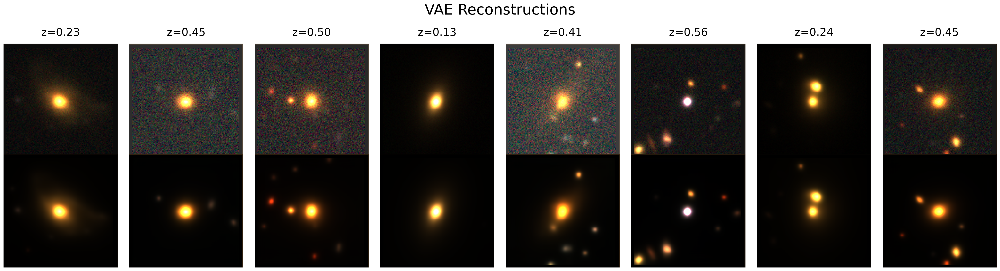

Latent statistics: mean=-0.0028  std=0.4762  min=-14.4333  max=13.9529
(Good VAE: mean≈0, std≈1, range roughly ±3)


In [30]:
ckpt = torch.load(CFG.vae_best, map_location=device, weights_only=False)
state = {k.replace("_orig_mod.", ""): v for k, v in ckpt["model"].items()}
vae.load_state_dict(state)
vae.eval()

imgs_v, z_v, morph_v = next(iter(val_vae_loader))
imgs_v = imgs_v.to(device)

with torch.no_grad():
    x_hat_v, mu_v, _ = vae(imgs_v)

n_show = 8
real_imgs = [to_rgb(imgs_v[i].cpu()) for i in range(n_show)]
recon_imgs = [to_rgb(x_hat_v[i].cpu()) for i in range(n_show)]
z_labels = [f"z={z_v[i].item():.2f}" for i in range(n_show)]

fig, axes = plt.subplots(2, n_show, figsize=(n_show * 1.8, 4), facecolor="white")
for col in range(n_show):
    axes[0, col].imshow(real_imgs[col], origin="lower"); axes[0, col].axis("off")
    axes[1, col].imshow(recon_imgs[col], origin="lower"); axes[1, col].axis("off")
    axes[0, col].set_title(z_labels[col], color="black", fontsize=11)

axes[0, 0].set_ylabel("Real", color="black", fontsize=15)
axes[1, 0].set_ylabel("Reconstructed", color="black", fontsize=15)
plt.suptitle("VAE Reconstructions", color="black", fontsize=15)
plt.tight_layout()
plt.savefig(os.path.join(CFG.reports_dir, "vae_reconstructions.png"),
            dpi=150, bbox_inches="tight", facecolor="white")
plt.show()

with torch.no_grad():
    all_mu = []
    for imgs_b, _, _ in val_vae_loader:
        _, mu_b, _ = vae(imgs_b.to(device))
        all_mu.append(mu_b.cpu())
all_mu = torch.cat(all_mu)
print(f"Latent statistics: mean={all_mu.mean():.4f}  std={all_mu.std():.4f}"
      f"  min={all_mu.min():.4f}  max={all_mu.max():.4f}")
print("(Good VAE: mean≈0, std≈1, range roughly ±3)")

In [24]:
RUN_VAE_FINETUNE = False

if RUN_VAE_FINETUNE:
    print("Fine-tuning VAE decoder only (encoder frozen)...")
    
    ckpt = torch.load(CFG.vae_best, map_location=device, weights_only=False)
    state = {k.replace("_orig_mod.", ""): v for k, v in ckpt["model"].items()}
    vae.load_state_dict(state)
    vae = vae.to(device)
    
    for param in vae.encoder.parameters():
        param.requires_grad = False
    
    for param in vae.decoder.parameters():
        param.requires_grad = True
    
    ft_optim = torch.optim.AdamW(
        filter(lambda p: p.requires_grad, vae.parameters()),
        lr=1e-5,
        weight_decay=1e-5
    )
    
    ft_kl_weight = 1e-3
    ft_best_loss = float("inf")
    ft_patience = 8
    ft_no_improve = 0
    
    epoch_bar = tqdm(range(1, 21), desc="VAE fine-tune", unit="ep",
                     bar_format="{desc}: {percentage:3.0f}%|{bar}| ep {n_fmt}/{total_fmt} [{elapsed}<{remaining}]")
    
    for epoch in epoch_bar:
        vae.train()
        train_loss = 0.0
    
        train_bar = tqdm(train_vae_loader, desc=f"  train ep {epoch:03d}",
                         leave=False, unit="batch",
                         bar_format="{desc}: {percentage:3.0f}%|{bar}| {n_fmt}/{total_fmt} [{elapsed}<{remaining}, {rate_fmt}]  recon={postfix[0]:.5f} kl={postfix[1]:.5f}",
                         postfix=[0.0, 0.0])
    
        for imgs_b, _, _ in train_bar:
            imgs_b = imgs_b.to(device, non_blocking=True)
    
            with torch.amp.autocast(device.type if device.type != "mps" else "cpu", enabled=use_amp):
                recon, mu, logvar = vae(imgs_b)
                recon_l = F.l1_loss(recon, imgs_b)
                kl_l = -0.5 * (1 + logvar - mu.pow(2) - logvar.exp()).mean()
                loss = recon_l + ft_kl_weight * kl_l
    
            scaler.scale(loss).backward()
            scaler.unscale_(ft_optim)
            torch.nn.utils.clip_grad_norm_(vae.parameters(), 1.0)
            scaler.step(ft_optim)
            scaler.update()
            ft_optim.zero_grad(set_to_none=True)
    
            train_loss += loss.item()
            train_bar.postfix[0] = recon_l.item()
            train_bar.postfix[1] = kl_l.item()
    
        vae.eval()
        val_loss = 0.0
    
        val_bar = tqdm(val_vae_loader, desc=f"  val   ep {epoch:03d}",
                       leave=False, unit="batch",
                       bar_format="{desc}: {percentage:3.0f}%|{bar}| {n_fmt}/{total_fmt} [{elapsed}<{remaining}]")
    
        with torch.no_grad():
            for imgs_b, _, _ in val_bar:
                imgs_b = imgs_b.to(device, non_blocking=True)
                recon, mu, logvar = vae(imgs_b)
                recon_l = F.l1_loss(recon, imgs_b)
                kl_l = -0.5 * (1 + logvar - mu.pow(2) - logvar.exp()).mean()
                val_loss += (recon_l + ft_kl_weight * kl_l).item()
    
        train_loss /= len(train_vae_loader)
        val_loss /= len(val_vae_loader)
    
        with torch.no_grad():
            sample_imgs = next(iter(val_vae_loader))[0][:64].to(device)
            z, _, _ = vae.encode(sample_imgs)
            lat_std = z.std().item()
            lat_mean = z.mean().item()
    
        improve_flag = "★" if val_loss < ft_best_loss - 1e-5 else " "
        epoch_bar.set_postfix_str(
            f"train={train_loss:.5f}  val={val_loss:.5f}  "
            f"best={ft_best_loss:.5f}  no_improve={ft_no_improve}/{ft_patience}  "
            f"lat_std={lat_std:.4f}  lat_mean={lat_mean:.4f}  {improve_flag}"
        )
    
        if val_loss < ft_best_loss - 1e-5:
            ft_best_loss = val_loss
            ft_no_improve = 0
            torch.save({"model": vae.state_dict(), "epoch": epoch,
                        "val_loss": val_loss}, CFG.vae_best)
            tqdm.write(f"  ★ ep {epoch:03d} | train={train_loss:.5f} val={val_loss:.5f} "
                       f"| lat_std={lat_std:.4f} lat_mean={lat_mean:.4f} → saved best")
        else:
            ft_no_improve += 1
            tqdm.write(f"    ep {epoch:03d} | train={train_loss:.5f} val={val_loss:.5f} "
                       f"| lat_std={lat_std:.4f} lat_mean={lat_mean:.4f} "
                       f"| no_improve={ft_no_improve}/{ft_patience}")
            if ft_no_improve >= ft_patience:
                tqdm.write(f"  Early stop at epoch {epoch}")
                break
    
    print(f"\nVAE fine-tune complete. Best val loss: {ft_best_loss:.5f}")
    
    for param in vae.encoder.parameters():
        param.requires_grad = True
else:
    _ft_ckpt = torch.load(CFG.vae_best, map_location="cpu", weights_only=False)
    _ft_ep = _ft_ckpt.get("epoch", "?")
    _ft_vl = _ft_ckpt.get("val_loss", float("nan"))
    if isinstance(_ft_ep, int) and _ft_ep >= 20:
        print(f"VAE fine-tune complete — all 20 epochs run. Best val loss: {_ft_vl:.5f}")
    else:
        print(f"VAE fine-tune paused at epoch {_ft_ep}/20. Best val loss: {_ft_vl:.5f}")


VAE fine-tune paused at epoch 3/20. Best val loss: 0.04069


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.6623759..23.696787].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.13163593..23.212969].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.47663355..8.334813].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.13210174..8.364552].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.4443966..7.326465].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.13124199..7.4204946].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.54267

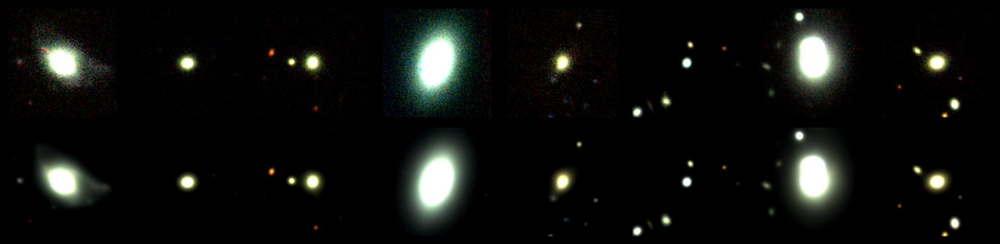

In [ ]:
vae.eval()
with torch.no_grad():
    imgs_b = next(iter(val_vae_loader))[0][:8].to(device)
    recon, _, _ = vae(imgs_b)

fig, axes = plt.subplots(2, 8, figsize=(20, 5), facecolor="black")
for i in range(8):
    axes[0,i].imshow(imgs_b[i,[3,2,1]].cpu().permute(1,2,0).numpy(), origin="lower")
    axes[1,i].imshow(recon[i,[3,2,1]].cpu().permute(1,2,0).numpy(), origin="lower")
    axes[0,i].axis("off"); axes[1,i].axis("off")
axes[0,0].set_ylabel("Real", color="white")
axes[1,0].set_ylabel("Recon", color="white")
plt.tight_layout(); plt.show()

In [25]:
vae.eval()
all_stds = []
with torch.no_grad():
    for imgs_b, _, _ in val_vae_loader:
        imgs_b = imgs_b.to(device)
        with torch.amp.autocast(device.type if device.type != "mps" else "cpu", enabled=use_amp):
            z, _, _ = vae.encode(imgs_b)
        all_stds.append(z.std().item())
        del z

new_scale = float(np.mean(all_stds))
CFG.latent_scale = new_scale
print(f"Updated latent_scale: {new_scale:.4f}")

Updated latent_scale: 0.4708


## 8. UNet Architecture

In [13]:
from src.models.ldm import SinusoidalEmbed, LatentUNet

unet = LatentUNet(
    CFG.latent_ch, CFG.unet_base_ch,
    tuple(CFG.unet_ch_mult), CFG.n_res_blocks,
    CFG.time_dim, CFG.cond_dim,
)
n_unet = sum(p.numel() for p in unet.parameters())
print(f'UNet parameters: {n_unet:,}')

dummy_lat = torch.randn(2, CFG.latent_ch, CFG.latent_size, CFG.latent_size)
dummy_t = torch.randint(0, CFG.T, (2,))
dummy_cond = torch.randn(2, CFG.cond_dim)
with torch.no_grad():
    out = unet(dummy_lat, dummy_t, dummy_cond)
print(f'UNet input shape : {tuple(dummy_lat.shape)}')
print(f'UNet output shape: {tuple(out.shape)}')


UNet parameters: 7,752,676
UNet input shape : (2, 4, 16, 16)
UNet output shape: (2, 4, 16, 16)


## 9. DDPM Scheduler

In [14]:
from src.models.ldm import DDPMScheduler

noise_sched = DDPMScheduler(CFG.T, CFG.beta_start, CFG.beta_end)
print(f'DDPM scheduler: T={CFG.T}, β₀={CFG.beta_start}, β_T={CFG.beta_end}')
print(f'α̅_T (signal at last step): {noise_sched.alpha_bar[-1].item():.6f}')


DDPM scheduler: T=1000, β₀=0.0001, β_T=0.02
α̅_T (signal at last step): 0.000040


## 10. Conditioning Module

In [15]:
from src.models.ldm import FourierEmbed, ConditioningModule

cond_module = ConditioningModule(
    CFG.n_morph, CFG.z_embed_dim,
    CFG.morph_embed_dim, CFG.cond_dim,
    CFG.redshift_sigma,
)
print(f'Conditioning parameters: {sum(p.numel() for p in cond_module.parameters()):,}')

with torch.no_grad():
    cond_dummy = cond_module(torch.rand(4), torch.randn(4, CFG.n_morph), training=False)
print(f'Conditioning output shape: {tuple(cond_dummy.shape)}')


Conditioning parameters: 79,040
Conditioning output shape: (4, 128)


## 11. Physics Predictor

In [16]:
from src.models.ldm import PhysicsPredictor

phys_pred = PhysicsPredictor(CFG.img_ch, CFG.n_morph)
print(f'PhysicsPredictor parameters: {sum(p.numel() for p in phys_pred.parameters()):,}')


PhysicsPredictor parameters: 1,012,228


In [17]:
phys_pred = phys_pred.to(device)

if os.path.exists(CFG.phys_ckpt):
    phys_pred.load_state_dict(torch.load(CFG.phys_ckpt, map_location=device,
                                          weights_only=True))
    print(f"Loaded pre-trained physics predictor from {CFG.phys_ckpt}")
else:
    print(f"Training physics predictor for {CFG.physics_predictor_epochs} epochs…")
    p_opt = optim.Adam(phys_pred.parameters(), lr=1e-3, weight_decay=1e-5)
    p_sched = CosineAnnealingLR(p_opt, T_max=CFG.physics_predictor_epochs, eta_min=1e-5)
    phys_pred.train()

    for ep in range(CFG.physics_predictor_epochs):
        t0 = time.time()
        z_mse_tot = m_mse_tot = 0.0
        for imgs_b, z_b, morph_b in tqdm(train_vae_loader,
                                          desc=f"PhysPredictor ep {ep+1}", leave=False):
            imgs_b = imgs_b.to(device, non_blocking=True)
            z_b = z_b.to(device, non_blocking=True)
            morph_b = morph_b.to(device, non_blocking=True)
            with torch.amp.autocast("cuda" if use_amp else "cpu", enabled=use_amp):
                z_pred, morph_pred = phys_pred(imgs_b)
                loss = F.mse_loss(z_pred, z_b) + F.mse_loss(morph_pred, morph_b)
            scaler.scale(loss).backward()
            scaler.step(p_opt); scaler.update(); p_opt.zero_grad(set_to_none=True)
            z_mse_tot += F.mse_loss(z_pred.detach(), z_b).item()
            m_mse_tot += F.mse_loss(morph_pred.detach(), morph_b).item()
        p_sched.step()
        n = len(train_vae_loader)
        print(f"  ep {ep+1}/{CFG.physics_predictor_epochs} | "
              f"z_RMSE={np.sqrt(z_mse_tot/n):.4f} | "
              f"morph_MSE={m_mse_tot/n:.4f} | t={time.time()-t0:.0f}s")

    torch.save(phys_pred.state_dict(), CFG.phys_ckpt)
    print("Physics predictor saved.")

for p in phys_pred.parameters(): p.requires_grad_(False)
phys_pred.eval()
print("Physics predictor frozen.")

def physics_loss(x0_pred: torch.Tensor, z_target: torch.Tensor,
                 morph_target: torch.Tensor) -> torch.Tensor:
    z_pred, morph_pred = phys_pred(x0_pred)
    L_z = F.mse_loss(z_pred, z_target)
    L_morph = F.mse_loss(morph_pred, morph_target)
    return CFG.lambda_z * L_z + CFG.lambda_morph * L_morph, L_z.item(), L_morph.item()

Loaded pre-trained physics predictor from /Users/arpinejanunts/Desktop/Capstone/models/galaxy_physics_predictor.pt
Physics predictor frozen.


## 12. LDM Training

In [18]:
def vram_str():
    if device.type == "cuda":
        used = torch.cuda.memory_reserved() / 1024**3
        total = torch.cuda.get_device_properties(0).total_memory / 1024**3
        return f"{used:.1f}/{total:.1f}GB"
    if device.type == "mps":
        return "MPS"
    return "CPU"

def ldm_step(imgs, z_b, morph_b, training=True, step=0):
    with torch.no_grad():
        z_lat, _, _ = vae.encode(imgs)
        z_lat = z_lat / CFG.latent_scale

    t = torch.randint(0, CFG.T, (imgs.size(0),), device=device)
    x_t, noise = noise_sched.q_sample(z_lat, t)
    cond = cond_module(z_b, morph_b, training=training)
    if training and torch.rand(1).item() < CFG.p_uncond:
        cond = torch.zeros_like(cond)

    compute_phys = (step % CFG.physics_loss_freq == 0)

    with torch.amp.autocast("cuda" if use_amp else "cpu", enabled=use_amp):
        eps_pred = unet(x_t, t, cond)
        ddpm_l = F.mse_loss(eps_pred, noise)

        if compute_phys:
            x0_est = noise_sched.predict_x0(x_t, t, eps_pred)
            x0_dec = vae.decode(x0_est * CFG.latent_scale)
            phys_l_total, L_z, L_morph = physics_loss(x0_dec, z_b, morph_b)
            total = ddpm_l + phys_l_total
        else:
            phys_l_total = torch.zeros(1, device=device)
            total = ddpm_l

    return total, ddpm_l.item(), phys_l_total.item()

vae = vae.to(device)
for p in vae.parameters(): p.requires_grad = False
vae.eval()

unet = unet.to(device)
ldm_params = list(unet.parameters()) + list(cond_module.parameters())
ldm_opt = optim.AdamW(ldm_params, lr=CFG.ldm_lr, weight_decay=1e-5,
                          betas=(0.9, 0.999))

from torch.optim.lr_scheduler import LinearLR, CosineAnnealingLR, SequentialLR
import gc

_warmup_epochs = 5
_warmup_sch = LinearLR(ldm_opt, start_factor=0.1, end_factor=1.0,
                        total_iters=_warmup_epochs)
_cos_sch = CosineAnnealingLR(ldm_opt,
                                 T_max=max(1, CFG.ldm_epochs - _warmup_epochs),
                                 eta_min=1e-6)
ldm_sch = SequentialLR(ldm_opt,
                        schedulers=[_warmup_sch, _cos_sch],
                        milestones=[_warmup_epochs])

ema_unet = EMA(unet, decay=CFG.ema_decay)
ema_cond = EMA(cond_module, decay=CFG.ema_decay)

start_ldm, best_ldm, no_ldm = 0, float('inf'), 0
ldm_train_hist = {"total": [], "ddpm": [], "phys": []}
ldm_val_hist = {"total": [], "ddpm": [], "phys": []}

print('─' * 55)
print(f"ldm_bs            {CFG.ldm_bs}          (should be 16)")
print(f"grad_accum        {CFG.grad_accum}          (should be 2)")
print(f"ldm_epochs        {CFG.ldm_epochs}         (should be 80)")
print(f"ldm_lr            {CFG.ldm_lr}       (should be 5e-5)")
print(f"physics_loss_freq {CFG.physics_loss_freq}        (should be 8)")
print(f"ema_decay         {CFG.ema_decay}      (should be 0.9999)")
print(f"latent_scale      {CFG.latent_scale:.4f}         (current value)")
print(f"scheduler type    {type(ldm_sch).__name__} (warmup {_warmup_epochs} ep + cosine)")
print(f"optimizer lr      {ldm_opt.param_groups[0]['lr']:.2e}")
print('─' * 55)

RESTART_FROM_BEST = True

_ckpt_path = CFG.ldm_best if RESTART_FROM_BEST else CFG.ldm_latest

if os.path.exists(_ckpt_path):
    ckpt = torch.load(_ckpt_path, map_location=device, weights_only=False)
    unet.load_state_dict(ckpt['unet'])
    cond_module.load_state_dict(ckpt['cond'])

    if RESTART_FROM_BEST:
        ldm_opt = optim.AdamW(ldm_params, lr=CFG.ldm_lr, weight_decay=1e-5,
                              betas=(0.9, 0.999))
        _ep_done = ckpt['epoch'] + 1
        _remaining = max(1, CFG.ldm_epochs - _ep_done)
        _warmup_sch = LinearLR(ldm_opt, start_factor=0.1, end_factor=1.0,
                                   total_iters=_warmup_epochs)
        _cos_sch = CosineAnnealingLR(ldm_opt, T_max=_remaining, eta_min=1e-6)
        ldm_sch = SequentialLR(ldm_opt,
                                       schedulers=[_warmup_sch, _cos_sch],
                                       milestones=[_warmup_epochs])
        start_ldm = _ep_done
        best_ldm = ckpt['best_val']
        no_ldm = 0
        ldm_train_hist = ckpt.get('train_hist', ldm_train_hist)
        ldm_val_hist = ckpt.get('val_hist', ldm_val_hist)
        print(f"Restarting from best checkpoint  epoch={start_ldm}  "
              f"best_val={best_ldm:.5f}")
        print(f"  ↳ Fresh AdamW at lr={CFG.ldm_lr:.1e}  |  "
              f"Cosine over {_remaining} remaining epochs  |  patience reset")
    else:
        ldm_opt.load_state_dict(ckpt['opt'])
        for pg in ldm_opt.param_groups:
            pg['lr'] = CFG.ldm_lr
            pg['initial_lr'] = CFG.ldm_lr
        print(f"  ↳ Optimizer LR reset to {CFG.ldm_lr:.1e}")
        start_ldm = ckpt['epoch'] + 1
        best_ldm = ckpt['best_val']
        no_ldm = ckpt.get('no_imp', 0)
        ldm_train_hist = ckpt.get('train_hist', ldm_train_hist)
        ldm_val_hist = ckpt.get('val_hist', ldm_val_hist)
        print(f"Resumed LDM from epoch {start_ldm}  best_val={best_ldm:.5f}")
        print("  ↳ Scheduler NOT restored — fresh SequentialLR (warmup + cosine)")
else:
    print("No checkpoint found — training LDM from scratch.")

print(f"train batches {len(train_ldm_loader)}")
print('─' * 55)


# Set to True to continue/restart LDM training
RUN_LDM_TRAINING = False

if RUN_LDM_TRAINING:
    epoch_bar = tqdm(range(start_ldm, CFG.ldm_epochs), desc="LDM epochs",
                     initial=start_ldm, total=CFG.ldm_epochs,
                     dynamic_ncols=True,
                     bar_format="{l_bar}{bar} {n_fmt}/{total_fmt} {elapsed}<{remaining} {postfix}")
    
    for ep in epoch_bar:
        t0 = time.time()
    
        unet.train(); cond_module.train()
        ep_tot = ep_ddpm = ep_phys = 0.0
        ldm_opt.zero_grad(set_to_none=True)
    
        train_bar = tqdm(train_ldm_loader,
                         desc=f"  train ep {ep:03d}",
                         leave=False, dynamic_ncols=True,
                         bar_format="{l_bar}{bar} {n_fmt}/{total_fmt} {elapsed}<{remaining} "
                                    "{rate_fmt} {postfix}")
    
        for step, (imgs_b, z_b, morph_b) in enumerate(train_bar):
            imgs_b = imgs_b.to(device, non_blocking=True)
            z_b = z_b.to(device, non_blocking=True)
            morph_b = morph_b.to(device, non_blocking=True)
    
            loss, ddpm_l, phys_l = ldm_step(imgs_b, z_b, morph_b, training=True, step=step)
            loss_scaled = loss / CFG.grad_accum
            scaler.scale(loss_scaled).backward()
    
            if (step + 1) % CFG.grad_accum == 0 or (step + 1) == len(train_ldm_loader):
                scaler.unscale_(ldm_opt)
                torch.nn.utils.clip_grad_norm_(ldm_params, 1.0)
                scaler.step(ldm_opt); scaler.update()
                ldm_opt.zero_grad(set_to_none=True)
                ema_unet.update(unet); ema_cond.update(cond_module)
    
            ep_tot += loss.item()
            ep_ddpm += ddpm_l
            ep_phys += phys_l
    
            n_sofar = step + 1
            train_bar.set_postfix(ordered_dict={
                "total": f"{ep_tot/n_sofar:.4f}",
                "ddpm": f"{ep_ddpm/n_sofar:.4f}",
                "phys": f"{ep_phys/n_sofar:.5f}",
                "LR": f"{ldm_opt.param_groups[0]['lr']:.1e}",
                "VRAM": vram_str(),
            })
    
        train_bar.close()
        n_tr = len(train_ldm_loader)
        tr_tot = ep_tot / n_tr
        tr_ddpm = ep_ddpm / n_tr
        tr_phys = ep_phys / n_tr
        ldm_train_hist["total"].append(tr_tot)
        ldm_train_hist["ddpm"].append(tr_ddpm)
        ldm_train_hist["phys"].append(tr_phys)
    
        unet.eval(); cond_module.eval()
        va_tot = va_ddpm = va_phys = 0.0
    
        val_bar = tqdm(val_ldm_loader,
                       desc=f"  val   ep {ep:03d}",
                       leave=False, dynamic_ncols=True,
                       bar_format="{l_bar}{bar} {n_fmt}/{total_fmt} {elapsed}<{remaining} {postfix}")
    
        with torch.no_grad():
            for i_v, (imgs_b, z_b, morph_b) in enumerate(val_bar):
                imgs_b = imgs_b.to(device, non_blocking=True)
                z_b = z_b.to(device, non_blocking=True)
                morph_b = morph_b.to(device, non_blocking=True)
                loss, ddpm_l, phys_l = ldm_step(imgs_b, z_b, morph_b, training=False)
                va_tot += loss.item()
                va_ddpm += ddpm_l
                va_phys += phys_l
                val_bar.set_postfix(ordered_dict={
                    "total": f"{va_tot/(i_v+1):.4f}",
                    "ddpm": f"{va_ddpm/(i_v+1):.4f}",
                })
    
        val_bar.close()
        n_vl = len(val_ldm_loader)
        va_tot = va_tot / n_vl
        va_ddpm = va_ddpm / n_vl
        va_phys = va_phys / n_vl
        ldm_val_hist["total"].append(va_tot)
        ldm_val_hist["ddpm"].append(va_ddpm)
        ldm_val_hist["phys"].append(va_phys)
    
        ldm_sch.step()
    
        is_best = va_tot < best_ldm * 0.999
        ep_time = time.time() - t0
    
        state = {"unet": unet.state_dict(), "cond": cond_module.state_dict(),
                 "opt": ldm_opt.state_dict(), "sch": ldm_sch.state_dict(),
                 "epoch": ep, "best_val": best_ldm, "no_imp": no_ldm,
                 "train_hist": ldm_train_hist, "val_hist": ldm_val_hist,
                 "ema_unet": {k: v.cpu() for k, v in ema_unet.shadow.items()},
                 "ema_cond": {k: v.cpu() for k, v in ema_cond.shadow.items()}}
        torch.save(state, CFG.ldm_latest)
    
        if is_best:
            best_ldm = va_tot; no_ldm = 0
            state["best_val"] = best_ldm
            torch.save(state, CFG.ldm_best)
            mark = " ★"
        else:
            no_ldm += 1
            mark = ""
    
        if ep % 10 == 0:
            gc.collect()
            if device.type == "cuda":
                torch.cuda.empty_cache()
            elif device.type == "mps":
                torch.mps.empty_cache()
            try:
                with open("/proc/sys/vm/drop_caches", "w") as f:
                    f.write("1")
            except (PermissionError, FileNotFoundError):
                pass
    
        epoch_bar.set_postfix(ordered_dict={
            "tr": f"{tr_tot:.4f}",
            "val": f"{va_tot:.4f}",
            "ddpm": f"{tr_ddpm:.4f}",
            "phys": f"{tr_phys:.5f}",
            "best": f"{best_ldm:.4f}",
            "no_imp": f"{no_ldm}/{CFG.ldm_patience}",
            "t/ep": f"{ep_time:.0f}s",
        })
    
        clear_output(wait=True)
        epoch_bar.display()
    
        fig, axes = plt.subplots(1, 3, figsize=(15, 4))
        for ax, key, label in zip(axes, ["total", "ddpm", "phys"],
                                   ["Total loss", "DDPM (noise pred)", "Physics loss"]):
            ax.plot(ldm_train_hist[key], color=GP[4], label="train")
            ax.plot(ldm_val_hist[key], color=GP[2], label="val")
            ax.set_title(label); ax.legend(); ax.set_yscale("log"); ax.grid(True)
        plt.suptitle(
            f"LDM — Epoch {ep+1}/{CFG.ldm_epochs}  "
            f"val={va_tot:.5f}  best={best_ldm:.5f}  "
            f"no_improve={no_ldm}/{CFG.ldm_patience}{mark}",
            fontsize=12)
        plt.tight_layout(); plt.show()
    
        if no_ldm >= CFG.ldm_patience:
            print(f"Early stopping at epoch {ep+1}."); break
    
    epoch_bar.close()
    print(f"\nLDM training complete.  Best val loss: {best_ldm:.5f}")
else:
    if start_ldm >= CFG.ldm_epochs:
        print(f"LDM training complete — all {CFG.ldm_epochs} epochs run. Best val loss: {best_ldm:.5f}")
    else:
        print(f"LDM training paused at epoch {start_ldm}/{CFG.ldm_epochs}. Best val loss: {best_ldm:.5f}")


───────────────────────────────────────────────────────
ldm_bs            16          (should be 16)
grad_accum        2          (should be 2)
ldm_epochs        160         (should be 80)
ldm_lr            5e-05       (should be 5e-5)
physics_loss_freq 8        (should be 8)
ema_decay         0.9999      (should be 0.9999)
latent_scale      0.4762         (current value)
scheduler type    SequentialLR (warmup 5 ep + cosine)
optimizer lr      5.00e-06
───────────────────────────────────────────────────────
Restarting from best checkpoint  epoch=151  best_val=0.09657
  ↳ Fresh AdamW at lr=5.0e-05  |  Cosine over 9 remaining epochs  |  patience reset
train batches 12786
───────────────────────────────────────────────────────
LDM training paused at epoch 151/160. Best val loss: 0.09657


## 13. Image Generation

EMA weights applied from checkpoint.
Inference latent scale: CFG.infer_scale = 1.0
Generating 16 galaxies  |  DDPM  |  eta=0.15  |  CFG=2.0x


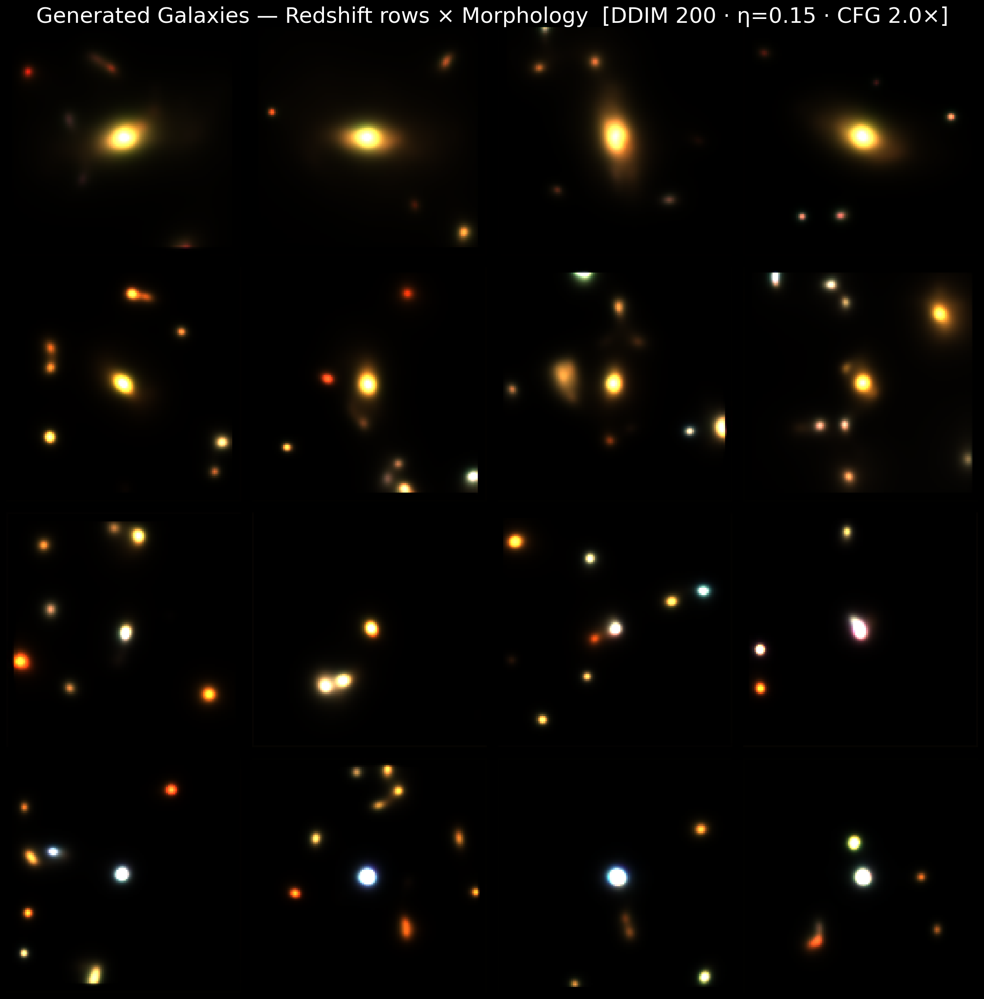

Generation complete.


In [19]:
from src.models.ldm import CFGWrapper, generate as ldm_generate

ckpt = torch.load(CFG.ldm_best, map_location=device, weights_only=False)
unet.load_state_dict(ckpt['unet'])
cond_module.load_state_dict(ckpt['cond'])

if 'ema_unet' in ckpt:
    _ema_u = EMA(unet, decay=CFG.ema_decay)
    _ema_c = EMA(cond_module, decay=CFG.ema_decay)
    _ema_u.shadow = {k: v.to(device) for k, v in ckpt['ema_unet'].items()}
    _ema_c.shadow = {k: v.to(device) for k, v in ckpt['ema_cond'].items()}
    _ema_u.apply(unet)
    _ema_c.apply(cond_module)
    print('EMA weights applied from checkpoint.')
else:
    print('No EMA shadow in checkpoint — using raw weights.')

unet.to(device); cond_module.to(device); vae.to(device)
unet.eval(); cond_module.eval(); vae.eval()
print(f'Inference latent scale: CFG.infer_scale = {CFG.infer_scale}')

import functools
generate = functools.partial(
    ldm_generate,
    cond_module=cond_module, unet=unet, vae=vae,
    noise_sched=noise_sched, cfg=CFG, device=device, use_amp=use_amp,
)

z_targets = torch.tensor([0.2, 0.5, 1.0, 2.0], dtype=torch.float32)
n_per_z = 4
gen_morph_list = []
for z_t in z_targets:
    mask = (train_ds.z_ten - z_t).abs() < 0.15
    mean_morph = train_ds.morph[mask].mean(0) if mask.sum() > 0 else torch.zeros(CFG.n_morph)
    gen_morph_list.append(mean_morph.unsqueeze(0).expand(n_per_z, -1))

all_z = z_targets.repeat_interleave(n_per_z)
all_morph = torch.cat(gen_morph_list, dim=0)

print(f'Generating {len(all_z)} galaxies  |  DDPM  |  eta=0.15  |  CFG={CFG.guidance_scale}x')
gen_imgs = generate(all_z, all_morph, method='ddpm', eta=0.15)

n_cols = n_per_z
n_rows = len(z_targets)
fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 1.9, n_rows * 1.9),
                          facecolor='black', constrained_layout=True)
for row, z_t in enumerate(z_targets):
    for col in range(n_per_z):
        ax = axes[row, col]
        ax.imshow(to_rgb(gen_imgs[row * n_per_z + col]), origin='lower')
        ax.axis('off')
        if col == 0:
            ax.set_ylabel(f'z={z_t:.1f}', color='white', fontsize=9)

plt.suptitle(
    f'Generated Galaxies — Redshift rows × Morphology  '
    f'[DDIM 200 · η=0.15 · CFG {CFG.guidance_scale}×]',
    color='white', fontsize=12, y=1.01)
plt.savefig(os.path.join(CFG.reports_dir, 'generated_galaxy_grid.png'),
            dpi=150, bbox_inches='tight', facecolor='black')
plt.show()
print('Generation complete.')


Running DDIM η=0.00 / 50 steps … 4s
Running DDIM η=0.15 / 50 steps … 3s
Running DDIM η=0.15 / 200 steps … 14s
Running DDPM / 1000 steps … 

DDPM sample:   0%|          | 0/1000 [00:00<?, ?it/s]

73s


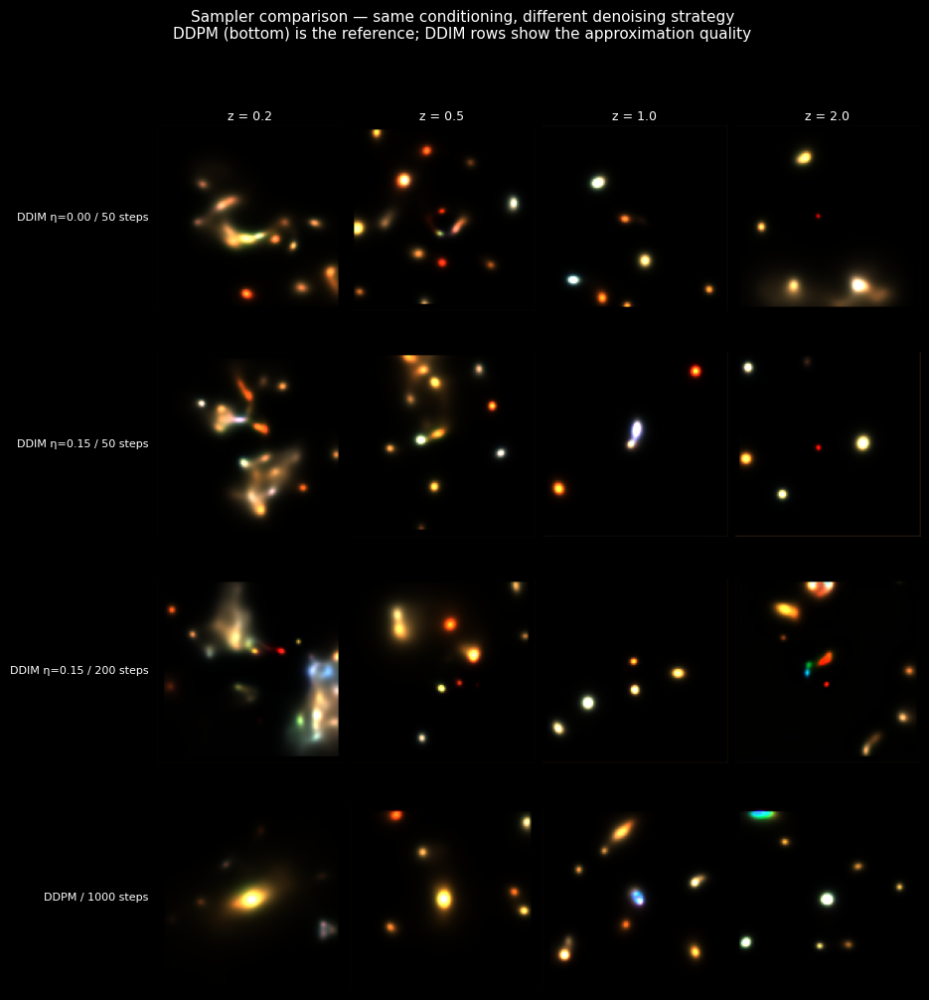


Interpretation guide:
  • If DDPM looks significantly sharper → increase ddim_steps or use DDPM for final outputs.
  • If DDIM η=0 is blurrier than η=0.15 → add eta=0.15 to all generate() calls.
  • If all four rows look similar → sampler is not the bottleneck; model quality is.


In [ ]:
cmp_z = torch.tensor([0.2, 0.5, 1.0, 2.0], dtype=torch.float32)
cmp_morph = torch.zeros(len(cmp_z), CFG.n_morph)
for i, z_t in enumerate(cmp_z):
    mask = (train_ds.z_ten - z_t).abs() < 0.15
    if mask.sum() > 0:
        cmp_morph[i] = train_ds.morph[mask].mean(0)

samplers = [
    ("DDIM η=0.00 / 50 steps", lambda: generate(cmp_z, cmp_morph, method="ddim", ddim_steps=50, eta=0.00)),
    ("DDIM η=0.15 / 50 steps", lambda: generate(cmp_z, cmp_morph, method="ddim", ddim_steps=50, eta=0.15)),
    ("DDIM η=0.15 / 200 steps", lambda: generate(cmp_z, cmp_morph, method="ddim", ddim_steps=200, eta=0.15)),
    ("DDPM / 1000 steps", lambda: generate(cmp_z, cmp_morph, method="ddpm")),
]

results = {}
for label, fn in samplers:
    print(f"Running {label} …", end=" ", flush=True)
    t0 = time.time()
    results[label] = fn()
    print(f"{time.time()-t0:.0f}s")

n_samplers = len(samplers)
n_z = len(cmp_z)

fig, axes = plt.subplots(
    n_samplers, n_z,
    figsize=(n_z * 2.4, n_samplers * 2.4 + 0.8),
    facecolor="black",
)
fig.subplots_adjust(left=0.18, right=0.98, top=0.88, bottom=0.02,
                    hspace=0.08, wspace=0.04)

for row, (label, _) in enumerate(samplers):
    for col, z_t in enumerate(cmp_z):
        ax = axes[row, col]
        ax.imshow(to_rgb(results[label][col]), origin="lower")
        ax.set_xticks([]); ax.set_yticks([])
        for spine in ax.spines.values():
            spine.set_visible(False)
        if col == 0:
            ax.set_ylabel(label, color="white", fontsize=8,
                          labelpad=6, rotation=0, ha="right", va="center")
        if row == 0:
            ax.set_title(f"z = {z_t:.1f}", color="white", fontsize=9, pad=4)

fig.suptitle(
    "Sampler comparison — same conditioning, different denoising strategy\n"
    "DDPM (bottom) is the reference; DDIM rows show the approximation quality",
    color="white", fontsize=11)

plt.savefig(os.path.join(CFG.reports_dir, "sampler_comparison.png"),
            dpi=150, bbox_inches="tight", facecolor="black")
plt.show()
print("\nInterpretation guide:")
print("  • If DDPM looks significantly sharper → increase ddim_steps or use DDPM for final outputs.")
print("  • If DDIM η=0 is blurrier than η=0.15 → add eta=0.15 to all generate() calls.")
print("  • If all four rows look similar → sampler is not the bottleneck; model quality is.")

## 14. Real vs Generated Comparison

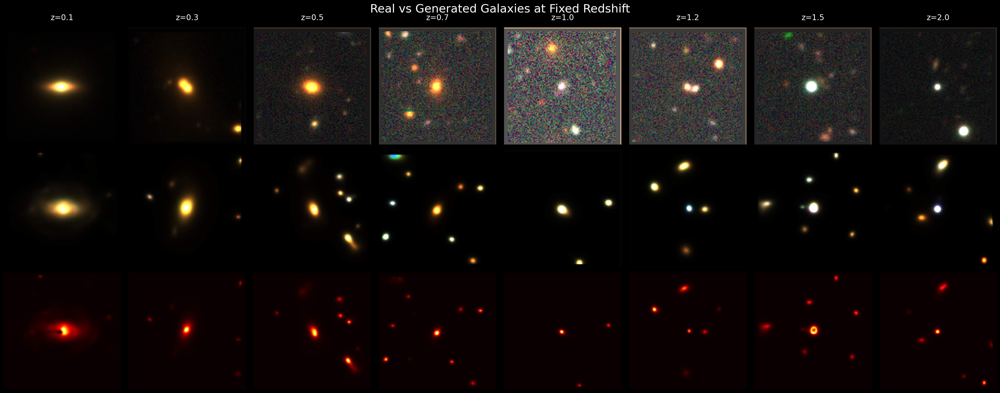

In [20]:
@torch.no_grad()
def find_nearest_real(z_q: float, morph_q: np.ndarray,
                      dataset: GalaxyDiffusionDataset,
                      n: int = 1) -> torch.Tensor:
    z_arr = dataset.z_ten.numpy()
    m_arr = dataset.morph.numpy()

    dz = ((z_arr - z_q) / max(z_arr.std(), 1e-4)) ** 2
    dm = ((m_arr - morph_q[None]) ** 2).mean(axis=1)
    dist = dz + dm
    top_n = np.argsort(dist)[:n]

    imgs = []
    for i in top_n:
        img, _, _ = dataset[i]
        imgs.append(img)
    return torch.stack(imgs)

compare_z = torch.tensor([0.1, 0.3, 0.5, 0.7, 1.0, 1.2, 1.5, 2.0], dtype=torch.float32)
compare_morph = torch.zeros(len(compare_z), CFG.n_morph)

for i, z_t in enumerate(compare_z):
    mask = (train_ds.z_ten - z_t).abs() < 0.1
    if mask.sum() > 0:
        compare_morph[i] = train_ds.morph[mask].mean(0)

gen_compare = generate(compare_z, compare_morph, method="ddpm")

fig, axes = plt.subplots(3, len(compare_z),
                          figsize=(len(compare_z) * 1.8, 5.5),
                          facecolor="black", constrained_layout=True)

for col, z_t in enumerate(compare_z):

    morph_q_np = compare_morph[col].numpy()
    real_nn = find_nearest_real(z_t.item(), morph_q_np, val_ds, n=1)[0]

    axes[0, col].imshow(to_rgb(real_nn), origin="lower"); axes[0, col].axis("off")
    axes[0, col].set_title(f"z={z_t:.1f}", color="white", fontsize=8)

    axes[1, col].imshow(to_rgb(gen_compare[col]), origin="lower"); axes[1, col].axis("off")

    diff = (denorm(real_nn) - denorm(gen_compare[col])).abs()
    diff_r = diff[2].numpy()
    axes[2, col].imshow(diff_r, cmap="hot", origin="lower"); axes[2, col].axis("off")

axes[0, 0].set_ylabel("Real", color="white", fontsize=9)
axes[1, 0].set_ylabel("Generated", color="white", fontsize=9)
axes[2, 0].set_ylabel("| Δ | r-band", color="white", fontsize=9)
plt.suptitle("Real vs Generated Galaxies at Fixed Redshift",
             color="white", fontsize=12, y=1.02)
plt.savefig(os.path.join(CFG.models_dir, "../reports/real_vs_generated.png"),
            dpi=150, bbox_inches="tight", facecolor="black")
plt.show()

## 15. Evaluation

In [21]:
def concentration(img: np.ndarray, r_inner: float = 0.2, r_outer: float = 0.8) -> float:
    h, w = img.shape
    cy, cx = h // 2, w // 2
    y, x = np.ogrid[:h, :w]
    r = np.sqrt((x - cx)**2 + (y - cy)**2)
    r_max = min(cx, cy)
    total = img.sum()
    if total <= 0: return 0.0
    cumsum = np.cumsum([img[r <= (f * r_max)].sum() / total
                        for f in np.linspace(0, 1, 100)])
    r20_idx = np.searchsorted(cumsum, 0.2)
    r80_idx = np.searchsorted(cumsum, 0.8)
    r20 = max(r20_idx * r_max / 100, 1e-3)
    r80 = max(r80_idx * r_max / 100, 1e-3)
    return 5 * np.log10(r80 / r20)

def asymmetry(img: np.ndarray) -> float:
    """Asymmetry A = sum|I - I_180| / (2 sum|I|)."""
    img_r = np.rot90(img, 2)
    diff = np.abs(img - img_r)
    denom = 2 * np.abs(img).sum()
    return diff.sum() / denom if denom > 0 else 0.0

def smoothness(img: np.ndarray, sigma: float = 3.0) -> float:
    """Smoothness S = sum|I - I_smoothed| / sum|I|."""
    from scipy.ndimage import gaussian_filter
    smooth = gaussian_filter(img, sigma=sigma)
    diff = np.abs(img - smooth)
    denom = np.abs(img).sum()
    return diff.sum() / denom if denom > 0 else 0.0

def cas_stats(img_tensor: torch.Tensor) -> dict:
    """Compute CAS on r-band (channel 2) of a (5,H,W) image."""
    r = denorm(img_tensor)[2].numpy().clip(0, None)
    return {"C": concentration(r), "A": asymmetry(r), "S": smoothness(r)}

def gini_coefficient(flux: np.ndarray) -> float:
    """Gini coefficient of pixel flux distribution."""
    f = np.abs(flux).flatten()
    f.sort()
    n = len(f)
    if f.sum() == 0 or n == 0: return 0.0
    idx = np.arange(1, n + 1)
    return (2 * (idx * f).sum() - (n + 1) * f.sum()) / (n * f.sum())

def m20(img: np.ndarray, brightest_fraction: float = 0.2) -> float:
    """M20 = log10(M_20 / M_tot) where M_20 is moment of brightest 20% pixels."""
    h, w = img.shape
    cy, cx = h // 2, w // 2
    y, x = np.indices((h, w))
    r2 = (x - cx)**2 + (y - cy)**2
    flat = img.flatten(); r2f = r2.flatten()
    total = (flat * r2f).sum()
    if total <= 0: return 0.0
    order = np.argsort(flat)[::-1]
    cumflu = np.cumsum(flat[order])
    thresh = brightest_fraction * flat.sum()
    bright_r2 = r2f[order[:np.searchsorted(cumflu, thresh) + 1]]
    bright_f = flat[order[:np.searchsorted(cumflu, thresh) + 1]]
    m20_val = (bright_f * bright_r2).sum()
    return np.log10(m20_val / total) if total > 0 else 0.0

def gini_m20(img_tensor: torch.Tensor) -> dict:
    r = denorm(img_tensor)[2].numpy().clip(0, None)
    return {"Gini": gini_coefficient(r), "M20": m20(r)}

print("CAS and Gini-M20 functions defined.")

CAS and Gini-M20 functions defined.


Computing CAS and Gini-M20 on test vs generated galaxies…


Eval: 100%|██████████| 7/7 [09:34<00:00, 82.07s/it]


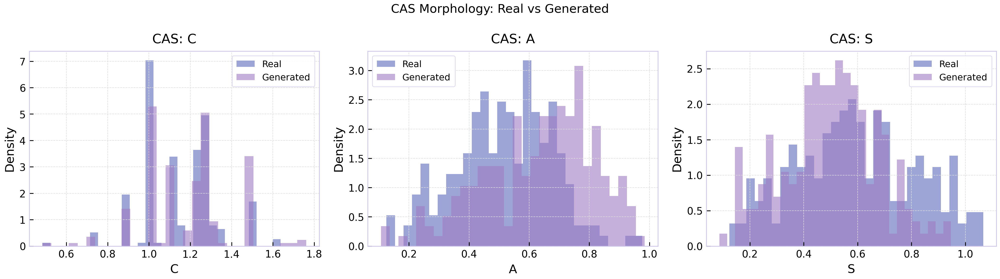


CAS KL-divergences (lower = more similar):
  KL(C): 0.3122
  KL(A): 1.0971
  KL(S): 1.4123


In [23]:
print("Computing CAS and Gini-M20 on test vs generated galaxies…")

N_EVAL = 200
test_sub = torch.utils.data.Subset(test_ds, list(range(N_EVAL)))
test_sub_loader = DataLoader(test_sub, batch_size=32, shuffle=False)

real_cas, gen_cas, real_gm, gen_gm = [], [], [], []
real_z_all, gen_z_pred_all = [], []

with torch.no_grad():
    for imgs_b, z_b, morph_b in tqdm(test_sub_loader, desc="Eval"):
        for i in range(len(imgs_b)):
            real_cas.append(cas_stats(imgs_b[i]))
            real_gm.append(gini_m20(imgs_b[i]))
            real_z_all.append(z_b[i].item())

        gen_b = generate(z_b, morph_b, method="ddpm")
        for i in range(len(gen_b)):
            gen_cas.append(cas_stats(gen_b[i]))
            gen_gm.append(gini_m20(gen_b[i]))

        z_pred, _ = phys_pred(gen_b.to(device))
        gen_z_pred_all.extend(z_pred.cpu().numpy().tolist())

real_z_arr = np.array(real_z_all)
gen_z_arr = np.array(gen_z_pred_all)

fig, axes = plt.subplots(1, 3, figsize=(14, 4))
for ax, key in zip(axes, ["C", "A", "S"]):
    r_vals = [d[key] for d in real_cas]
    g_vals = [d[key] for d in gen_cas]
    ax.hist(r_vals, bins=30, alpha=0.6, color=GP[4], label="Real", density=True)
    ax.hist(g_vals, bins=30, alpha=0.6, color=GP[2], label="Generated", density=True)
    ax.set_xlabel(key); ax.set_ylabel("Density"); ax.legend()
    ax.set_title(f"CAS: {key}")
plt.suptitle("CAS Morphology: Real vs Generated", fontsize=12)
plt.tight_layout()
plt.savefig(os.path.join(CFG.models_dir, "../reports/cas_comparison.png"),
            dpi=150, bbox_inches="tight")
plt.show()

from scipy.stats import entropy
def kl_hist(a, b, bins=30):
    lo, hi = min(a.min(), b.min()), max(a.max(), b.max())
    pa, _ = np.histogram(a, bins=bins, range=(lo,hi), density=True)
    pb, _ = np.histogram(b, bins=bins, range=(lo,hi), density=True)
    pa = pa + 1e-8; pb = pb + 1e-8
    pa /= pa.sum(); pb /= pb.sum()
    return entropy(pa, pb)

print("\nCAS KL-divergences (lower = more similar):")
for key in ["C", "A", "S"]:
    r_v = np.array([d[key] for d in real_cas])
    g_v = np.array([d[key] for d in gen_cas])
    print(f"  KL({key}): {kl_hist(r_v, g_v):.4f}")

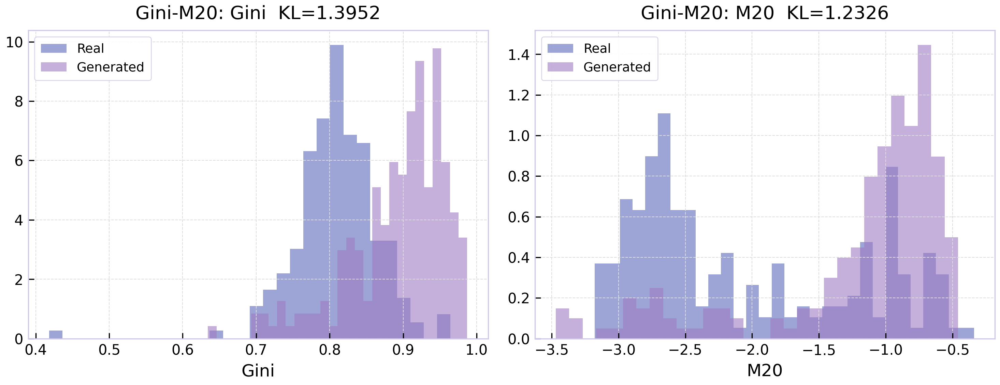


KL divergence (real vs generated) by redshift bin:
  Bin             N_real      KL_C      KL_A   KL_Gini    z_bias    z_RMSE
  z=[0.00,0.25)       24    3.2175    8.3902   11.4309   -0.0930    0.1281
  z=[0.25,0.50)       65    0.4212    4.1714    1.3183   -0.0675    0.6111
  z=[0.50,0.75)       64    1.4726    6.5834   14.0459   -0.1412    0.4288
  z=[0.75,1.00)       16    2.4626   10.4364   20.9986    0.0899    0.6190
  z=[1.00,1.50)        7    2.9066   21.2256   15.8152   -0.0534    0.4486
  z=[1.50,2.00)        7    6.4471   15.4886   18.2919   -0.2684    1.0775
  z=[2.00,3.00)       14    7.3210   17.3852   16.4048   -0.8189    1.0114

Overall redshift consistency:
  Bias (z_generated - z_target) : -0.1545
  RMSE                          : 0.5909


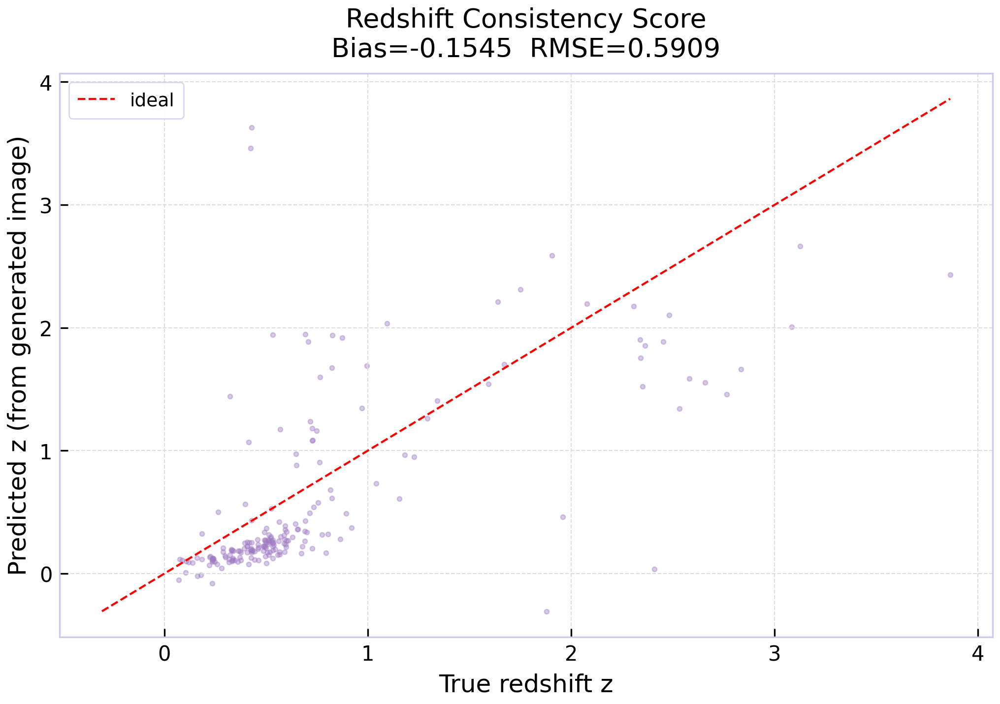

In [24]:
fig, axes = plt.subplots(1, 2, figsize=(10, 4))
for ax, key in zip(axes, ["Gini", "M20"]):
    r_v = np.array([d[key] for d in real_gm])
    g_v = np.array([d[key] for d in gen_gm])
    ax.hist(r_v, bins=30, alpha=0.6, color=GP[4], label="Real", density=True)
    ax.hist(g_v, bins=30, alpha=0.6, color=GP[2], label="Generated", density=True)
    ax.set_xlabel(key); ax.legend()
    ax.set_title(f"Gini-M20: {key}  KL={kl_hist(r_v,g_v):.4f}")
plt.tight_layout()
plt.savefig(os.path.join(CFG.models_dir, "../reports/gini_m20_comparison.png"), dpi=150)
plt.show()

bins = [0.0, 0.25, 0.5, 0.75, 1.0, 1.5, 2.0, 3.0]
print("\nKL divergence (real vs generated) by redshift bin:")
print(f"  {'Bin':<14} {'N_real':>7}  {'KL_C':>8}  {'KL_A':>8}  {'KL_Gini':>8}  "
      f"{'z_bias':>8}  {'z_RMSE':>8}")
for b0, b1 in zip(bins[:-1], bins[1:]):
    mask_r = (real_z_arr >= b0) & (real_z_arr < b1)
    if mask_r.sum() < 5: continue
    mask_i = np.where(mask_r)[0]
    r_c = np.array([real_cas[i]["C"] for i in mask_i])
    g_c = np.array([gen_cas[i]["C"] for i in mask_i])
    r_a = np.array([real_cas[i]["A"] for i in mask_i])
    g_a = np.array([gen_cas[i]["A"] for i in mask_i])
    r_gi = np.array([real_gm[i]["Gini"] for i in mask_i])
    g_gi = np.array([gen_gm[i]["Gini"] for i in mask_i])
    z_b_arr = real_z_arr[mask_r]
    z_g_arr = gen_z_arr[mask_i] if len(gen_z_pred_all) > max(mask_i) else z_b_arr
    bias = (z_g_arr - z_b_arr).mean()
    rmse = np.sqrt(((z_g_arr - z_b_arr)**2).mean())
    print(f"  z=[{b0:.2f},{b1:.2f})  {mask_r.sum():>7}  "
          f"{kl_hist(r_c, g_c):>8.4f}  {kl_hist(r_a, g_a):>8.4f}  "
          f"{kl_hist(r_gi,g_gi):>8.4f}  {bias:>8.4f}  {rmse:>8.4f}")

z_bias_total = (gen_z_arr - real_z_arr[:len(gen_z_arr)]).mean()
z_rmse_total = np.sqrt(((gen_z_arr - real_z_arr[:len(gen_z_arr)])**2).mean())
print(f"\nOverall redshift consistency:")
print(f"  Bias (z_generated - z_target) : {z_bias_total:.4f}")
print(f"  RMSE                          : {z_rmse_total:.4f}")

fig, ax = plt.subplots(figsize=(7, 5))
ax.scatter(real_z_arr[:len(gen_z_arr)], gen_z_arr, alpha=0.4, s=5, color=GP[2])
lo = min(real_z_arr.min(), gen_z_arr.min()); hi = max(real_z_arr.max(), gen_z_arr.max())
ax.plot([lo, hi], [lo, hi], "r--", lw=1, label="ideal")
ax.set_xlabel("True redshift z"); ax.set_ylabel("Predicted z (from generated image)")
ax.set_title(f"Redshift Consistency Score\nBias={z_bias_total:.4f}  RMSE={z_rmse_total:.4f}")
ax.legend()
plt.tight_layout()
plt.savefig(os.path.join(CFG.models_dir, "../reports/redshift_consistency.png"), dpi=150)
plt.show()

In [28]:
from scipy.stats import gaussian_kde

stats_keys = [
    ('C', 'Concentration', real_cas, gen_cas),
    ('A', 'Asymmetry', real_cas, gen_cas),
    ('S', 'Smoothness', real_cas, gen_cas),
    ('Gini', 'Gini', real_gm, gen_gm),
    ('M20', 'M20', real_gm, gen_gm),
]

N_GALLERY = 6
gallery_loader = DataLoader(
    torch.utils.data.Subset(test_ds, list(range(N_GALLERY * 4))),
    batch_size=N_GALLERY * 4, shuffle=False
)
gallery_imgs_b, gallery_z_b, gallery_morph_b = next(iter(gallery_loader))

z_vals_np = gallery_z_b.numpy()
sorted_idx = np.argsort(z_vals_np)
step = max(1, len(sorted_idx) // N_GALLERY)
pick = sorted_idx[::step][:N_GALLERY]
sel_real = gallery_imgs_b[pick]
sel_z = gallery_z_b[pick]
sel_morph = gallery_morph_b[pick]

with torch.no_grad():
    sel_gen = generate(sel_z, sel_morph, method='ddpm').cpu()

BG = '#FFFFFF'
CLR_R = '#5a8fd4'
CLR_G = '#b87fd4'
FILL_A = 0.20
LINE_W = 6.0

fig = plt.figure(figsize=(80, 44), facecolor=BG)
fig.patch.set_facecolor(BG)

gs_top = fig.add_gridspec(2, N_GALLERY,
                           left=0.03, right=0.97,
                           top=0.96, bottom=0.52,
                           hspace=0.04, wspace=0.04)
gs_bot = fig.add_gridspec(1, 5,
                           left=0.05, right=0.97,
                           top=0.44, bottom=0.07,
                           wspace=0.30)

for col in range(N_GALLERY):
    for row, (imgs, label, clr) in enumerate([
            (sel_real, 'Real', CLR_R),
            (sel_gen, 'Generated', CLR_G)]):
        ax = fig.add_subplot(gs_top[row, col])
        ax.imshow(to_rgb(imgs[col]), origin='lower', aspect='equal')
        ax.set_xticks([]); ax.set_yticks([])
        for spine in ax.spines.values():
            spine.set_edgecolor(clr)
            spine.set_linewidth(4.0)
        if col == 0:
            ax.set_ylabel(label, color=clr, fontsize=72, fontweight='bold',
                          rotation=90, labelpad=12)
        if row == 0:
            ax.set_title(f'z = {sel_z[col].item():.2f}',
                         color='#333355', fontsize=60, pad=6)

def kde_panel(ax, key, xlabel, real_list, gen_list):
    r_vals = np.array([d[key] for d in real_list], dtype=float)
    g_vals = np.array([d[key] for d in gen_list], dtype=float)
    lo = min(r_vals.min(), g_vals.min())
    hi = max(r_vals.max(), g_vals.max())
    pad = (hi - lo) * 0.12
    xs = np.linspace(lo - pad, hi + pad, 500)

    kde_r = gaussian_kde(r_vals, bw_method=0.25)
    kde_g = gaussian_kde(g_vals, bw_method=0.25)
    yr, yg = kde_r(xs), kde_g(xs)

    ax.fill_between(xs, yr, alpha=FILL_A, color=CLR_R)
    ax.fill_between(xs, yg, alpha=FILL_A, color=CLR_G)
    ax.plot(xs, yr, color=CLR_R, lw=LINE_W, label='Real')
    ax.plot(xs, yg, color=CLR_G, lw=LINE_W, label='Generated', ls='--')

    ax.set_facecolor(BG)
    ax.set_xlabel(xlabel, color='#333355', fontsize=66, labelpad=10)
    ax.set_ylabel('Density', color='#333355', fontsize=60)
    for spine in ax.spines.values():
        spine.set_edgecolor('#333355')
    ax.tick_params(colors='#333355', labelsize=75)
    ax.yaxis.label.set_color('#333355')

    lo2, hi2 = min(r_vals.min(), g_vals.min()), max(r_vals.max(), g_vals.max())
    pa, _ = np.histogram(r_vals, bins=30, range=(lo2, hi2), density=True)
    pb, _ = np.histogram(g_vals, bins=30, range=(lo2, hi2), density=True)
    pa = pa + 1e-8; pb = pb + 1e-8
    pa /= pa.sum(); pb /= pb.sum()
    from scipy.stats import entropy
    kl = entropy(pa, pb)

    legend = ax.legend(fontsize=60, framealpha=0,
                       labelcolor='#333355', loc='upper left')
    for line in legend.get_lines():
        line.set_linewidth(4)
    ax.grid(axis='y', color='#222244', linewidth=1.5, alpha=0.6)

axes_bot = [fig.add_subplot(gs_bot[0, i]) for i in range(5)]
for ax, (key, xlabel, rlist, glist) in zip(axes_bot, stats_keys):
    kde_panel(ax, key, xlabel, rlist, glist)

fig.text(0.50, 0.995, 'Galaxy LDM — Real vs Generated Distribution',
         ha='center', va='top', color='#333355', fontsize=65, fontweight='bold')

plt.savefig(os.path.join(CFG.reports_dir, 'poster_distributions.pdf'),
            dpi=300, bbox_inches='tight', facecolor=BG)
plt.savefig(os.path.join(CFG.reports_dir, 'poster_distributions.png'),
            dpi=300, bbox_inches='tight', facecolor=BG)
plt.show()
print('Saved: reports/poster_distributions.pdf  (300 dpi, vector text)')
print('Saved: reports/poster_distributions.png  (300 dpi raster)')

Saved: reports/poster_distributions.pdf  (300 dpi, vector text)
Saved: reports/poster_distributions.png  (300 dpi raster)


## 16. Quality Confirmation

In [24]:
best_ldm = 0.009657
print("=" * 60)
print("  Galaxy LDM — Evaluation Summary")
print("=" * 60)
print(f"  VAE best val ELBO   : {best_vae:.5f}")
print(f"  LDM best val loss   : {best_ldm:.5f}")
print()
print("  CAS KL-divergences (real ‖ generated):")
for key in ["C", "A", "S"]:
    r_v = np.array([d[key] for d in real_cas])
    g_v = np.array([d[key] for d in gen_cas])
    print(f"    {key}: {kl_hist(r_v, g_v):.4f}")
print()
print("  Gini-M20 KL-divergences:")
for key in ["Gini", "M20"]:
    r_v = np.array([d[key] for d in real_gm])
    g_v = np.array([d[key] for d in gen_gm])
    print(f"    {key}: {kl_hist(r_v, g_v):.4f}")
print()
print(f"  Redshift consistency  Bias={z_bias_total:.4f}  RMSE={z_rmse_total:.4f}")
print()
print("  Saved outputs:")
for f in ["vae_reconstructions", "generated_galaxy_grid", "real_vs_generated",
          "cas_comparison", "gini_m20_comparison", "redshift_consistency"]:
    p = os.path.join(CFG.models_dir, f"../reports/{f}.png")
    print(f"    {f}.png : {'✓' if os.path.exists(p) else '✗'}")

  Galaxy LDM — Evaluation Summary
  VAE best val ELBO   : 0.04198
  LDM best val loss   : 0.00966

  CAS KL-divergences (real ‖ generated):
    C: 0.2670
    A: 0.5176
    S: 0.8869

  Gini-M20 KL-divergences:
    Gini: 1.2382
    M20: 1.5516

  Redshift consistency  Bias=-0.2322  RMSE=0.6855

  Saved outputs:
    vae_reconstructions.png : ✓
    generated_galaxy_grid.png : ✓
    real_vs_generated.png : ✓
    cas_comparison.png : ✓
    gini_m20_comparison.png : ✓
    redshift_consistency.png : ✓


In [29]:
from scipy.linalg import sqrtm as mat_sqrtm
from scipy.stats import pearsonr, spearmanr

unet.eval(); cond_module.eval(); vae.eval(); phys_pred.eval()

def half_light_radius(img_t):
    lum = img_t.mean(0).numpy()
    lum = np.clip(lum, 0, None)
    h, w = lum.shape
    cy, cx = h // 2, w // 2
    y, x = np.ogrid[:h, :w]
    r = np.sqrt((x - cx)**2 + (y - cy)**2)
    total = lum.sum()
    if total <= 0: return 0.0
    r_flat = r.ravel(); l_flat = lum.ravel()
    order = np.argsort(r_flat)
    cum = np.cumsum(l_flat[order]) / total
    idx = np.searchsorted(cum, 0.5)
    return float(r_flat[order[idx]])

def extract_features(imgs, batch_size=32):
    feats = []
    for i in range(0, len(imgs), batch_size):
        chunk = imgs[i:i+batch_size].to(device)
        with torch.no_grad():
            f = phys_pred.backbone(chunk)
        feats.append(f.cpu().numpy())
    return np.concatenate(feats, axis=0)

def compute_fid(feat_real, feat_gen):
    mu_r, mu_g = feat_real.mean(0), feat_gen.mean(0)
    sig_r = np.cov(feat_real, rowvar=False)
    sig_g = np.cov(feat_gen, rowvar=False)
    diff = mu_r - mu_g
    covmean, _ = mat_sqrtm(sig_r @ sig_g, disp=False)
    if np.iscomplexobj(covmean):
        covmean = covmean.real
    return float(diff @ diff + np.trace(sig_r + sig_g - 2 * covmean))

N_EVAL = 200
test_sub = torch.utils.data.Subset(test_ds, list(range(N_EVAL)))
sub_loader = DataLoader(test_sub, batch_size=32, shuffle=False)

In [26]:
print('\n[1/4] Feature-FID (phys_pred backbone features)...')
all_real, all_gen = [], []
with torch.no_grad():
    for imgs_b, z_b, morph_b in tqdm(sub_loader, desc='  FID batches', leave=False):
        all_real.append(imgs_b)
        gen_b = generate(z_b, morph_b, method='ddpm')
        all_gen.append(gen_b.cpu())

all_real = torch.cat(all_real, 0)
all_gen = torch.cat(all_gen, 0)

feat_real = extract_features(all_real)
feat_gen = extract_features(all_gen)
fid_score = compute_fid(feat_real, feat_gen)

FID_SOTA = 12.0
FID_DCGAN = 85.0
verdict_fid = 'GOOD' if fid_score < 30 else ('FAIR' if fid_score < 60 else 'POOR')
print(f'  Feature-FID : {fid_score:.2f}')
print(f'  Reference   : SOTA ~ {FID_SOTA}  |  DCGAN baseline ~ {FID_DCGAN}')
print(f'  Verdict     : {verdict_fid}')


[1/4] Feature-FID (phys_pred backbone features)...


  FID batches:   0%|          | 0/7 [00:00<?, ?it/s]

DDPM sample:   0%|          | 0/1000 [00:00<?, ?it/s]

DDPM sample:   0%|          | 0/1000 [00:00<?, ?it/s]

DDPM sample:   0%|          | 0/1000 [00:00<?, ?it/s]

DDPM sample:   0%|          | 0/1000 [00:00<?, ?it/s]

DDPM sample:   0%|          | 0/1000 [00:00<?, ?it/s]

DDPM sample:   0%|          | 0/1000 [00:00<?, ?it/s]

DDPM sample:   0%|          | 0/1000 [00:00<?, ?it/s]

  Feature-FID : 80.29
  Reference   : SOTA ~ 12.0  |  DCGAN baseline ~ 85.0
  Verdict     : POOR



[2/4] Diversity -- 16 images at fixed conditioning (z=0.5)...


  Mean pairwise MSE : 22.69749
  Per-pixel std     : 1.24637
  Verdict           : DIVERSE (healthy)


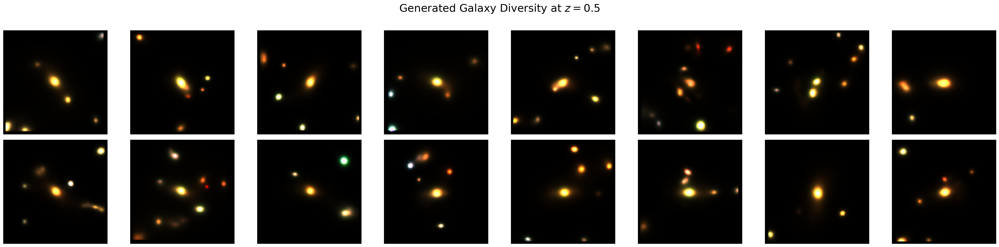

In [30]:
print('\n[2/4] Diversity -- 16 images at fixed conditioning (z=0.5)...')
Z_TEST = 0.5
MORPH_REF = torch.zeros(1, CFG.n_morph)
z_fixed = torch.full((16,), Z_TEST)
morph_fixed = MORPH_REF.expand(16, -1)
batch_16 = generate(z_fixed, morph_fixed, method='ddpm').cpu()

imgs_flat = batch_16.view(16, -1).numpy()
diffs = []
for i in range(16):
    for j in range(i + 1, 16):
        diffs.append(float(np.mean((imgs_flat[i] - imgs_flat[j])**2)))
mean_pairwise = float(np.mean(diffs))
per_pixel_std = float(batch_16.std(0).mean().item())

collapsed = per_pixel_std < 0.01
verdict_div = 'DIVERSE (healthy)' if not collapsed else 'COLLAPSED (critical)'
print(f'  Mean pairwise MSE : {mean_pairwise:.5f}')
print(f'  Per-pixel std     : {per_pixel_std:.5f}')
print(f'  Verdict           : {verdict_div}')

fig, axes = plt.subplots(2, 8, figsize=(16, 4))
fig.suptitle(f'Generated Galaxy Diversity at $z = {Z_TEST}$', fontsize=12)
for ax, img in zip(axes.ravel(), batch_16):
    ax.imshow(to_rgb(img), origin='lower')
    ax.axis('off')
plt.tight_layout()
plt.savefig(os.path.join(CFG.models_dir, '../reports/diversity_check.png'),
            dpi=120, bbox_inches='tight')
plt.show()


[3/4] Conditional fidelity -- does z conditioning embed in pixels?...


  z-fidelity:   0%|          | 0/8 [00:00<?, ?it/s]

DDPM sample:   0%|          | 0/1000 [00:00<?, ?it/s]

DDPM sample:   0%|          | 0/1000 [00:00<?, ?it/s]

DDPM sample:   0%|          | 0/1000 [00:00<?, ?it/s]

DDPM sample:   0%|          | 0/1000 [00:00<?, ?it/s]

DDPM sample:   0%|          | 0/1000 [00:00<?, ?it/s]

DDPM sample:   0%|          | 0/1000 [00:00<?, ?it/s]

DDPM sample:   0%|          | 0/1000 [00:00<?, ?it/s]

DDPM sample:   0%|          | 0/1000 [00:00<?, ?it/s]

  Bias      : -0.6353
  RMSE      : 0.8785
  Pearson r : 0.6442
  Verdict   : FAIR (r>0.4)


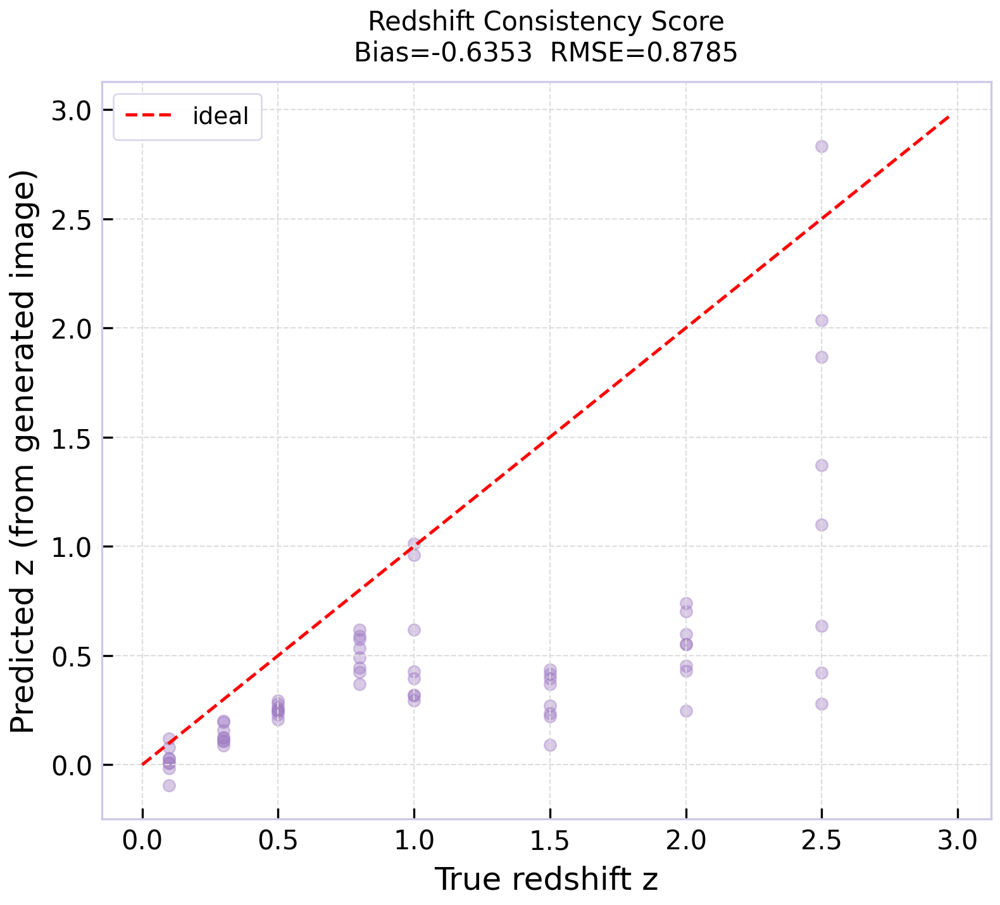

In [27]:
print('\n[3/4] Conditional fidelity -- does z conditioning embed in pixels?...')
z_targets = [0.1, 0.3, 0.5, 0.8, 1.0, 1.5, 2.0, 2.5]
N_PER_Z = 8
target_z_all, pred_z_all = [], []

with torch.no_grad():
    for z_t in tqdm(z_targets, desc='  z-fidelity', leave=False):
        z_t_vec = torch.full((N_PER_Z,), z_t)
        morph_zero = torch.zeros(N_PER_Z, CFG.n_morph)
        gen_b = generate(z_t_vec, morph_zero, method='ddpm').to(device)
        z_pred, _ = phys_pred(gen_b)
        target_z_all.extend([z_t] * N_PER_Z)
        pred_z_all.extend(z_pred.cpu().numpy().tolist())

target_z_arr = np.array(target_z_all)
pred_z_arr = np.array(pred_z_all)
bias_cf = float(np.mean(pred_z_arr - target_z_arr))
rmse_cf = float(np.sqrt(np.mean((pred_z_arr - target_z_arr)**2)))
r_val, _ = pearsonr(target_z_arr, pred_z_arr)

verdict_cf = 'GOOD (r>0.7)' if r_val > 0.7 else ('FAIR (r>0.4)' if r_val > 0.4 else 'POOR')
print(f'  Bias      : {bias_cf:+.4f}')
print(f'  RMSE      : {rmse_cf:.4f}')
print(f'  Pearson r : {r_val:.4f}')
print(f'  Verdict   : {verdict_cf}')

fig, ax = plt.subplots(figsize=(5.5, 5))
ax.scatter(target_z_arr, pred_z_arr, alpha=0.4, s=20, color=GP[2])
_lim = max(target_z_arr.max(), pred_z_arr.max()) * 1.05
ax.plot([0, _lim], [0, _lim], 'r--', lw=1.2, label='ideal')
ax.set_xlabel('True redshift z')
ax.set_ylabel('Predicted z (from generated image)')
ax.set_title(f'Redshift Consistency Score\nBias={bias_cf:.4f}  RMSE={rmse_cf:.4f}', fontsize=10)
ax.legend(fontsize=9)
plt.tight_layout()
plt.savefig(os.path.join(CFG.models_dir, '../reports/conditional_fidelity.png'),
            dpi=150, bbox_inches='tight')
plt.show()


[4/4] Physical scaling relations -- half-light radius & flux vs redshift...


  scaling (gen):   0%|          | 0/9 [00:00<?, ?it/s]

DDPM sample:   0%|          | 0/1000 [00:00<?, ?it/s]

DDPM sample:   0%|          | 0/1000 [00:00<?, ?it/s]

DDPM sample:   0%|          | 0/1000 [00:00<?, ?it/s]

DDPM sample:   0%|          | 0/1000 [00:00<?, ?it/s]

DDPM sample:   0%|          | 0/1000 [00:00<?, ?it/s]

DDPM sample:   0%|          | 0/1000 [00:00<?, ?it/s]

DDPM sample:   0%|          | 0/1000 [00:00<?, ?it/s]

DDPM sample:   0%|          | 0/1000 [00:00<?, ?it/s]

DDPM sample:   0%|          | 0/1000 [00:00<?, ?it/s]

  HLR  Spearman rho vs z : +0.317  -> wrong (+)
  Flux Spearman rho vs z : -0.603  -> correct (-)


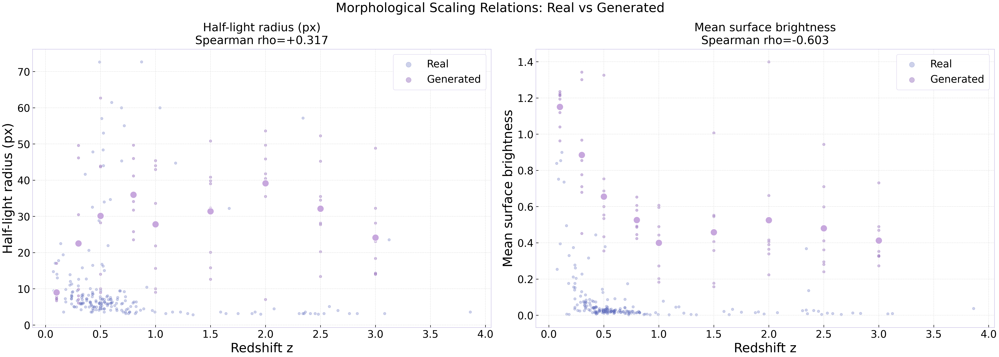

In [28]:
print('\n[4/4] Physical scaling relations -- half-light radius & flux vs redshift...')
z_bins = [0.1, 0.3, 0.5, 0.8, 1.0, 1.5, 2.0, 2.5, 3.0]
N_PER_BIN = 8
hlr_gen, flux_gen, z_gen_vals = [], [], []
hlr_real, flux_real, z_real_vals = [], [], []

with torch.no_grad():
    for z_t in tqdm(z_bins, desc='  scaling (gen)', leave=False):
        z_vec = torch.full((N_PER_BIN,), z_t)
        m_vec = torch.zeros(N_PER_BIN, CFG.n_morph)
        gen_b = generate(z_vec, m_vec, method='ddpm').cpu()
        for img in gen_b:
            hlr_gen.append(half_light_radius(img))
            flux_gen.append(float(img.mean(0).clamp(0).numpy().mean()))
            z_gen_vals.append(z_t)

    for imgs_b, z_b, _ in sub_loader:
        for img, z_val in zip(imgs_b, z_b):
            hlr_real.append(half_light_radius(img))
            flux_real.append(float(img.mean(0).clamp(0).numpy().mean()))
            z_real_vals.append(float(z_val.item()))

hlr_gen = np.array(hlr_gen); flux_gen = np.array(flux_gen); z_gen_vals = np.array(z_gen_vals)
hlr_real = np.array(hlr_real); flux_real = np.array(flux_real); z_real_vals = np.array(z_real_vals)

r_hlr, _ = spearmanr(z_gen_vals, hlr_gen)
r_flux, _ = spearmanr(z_gen_vals, flux_gen)
hlr_trend = 'correct (-)' if r_hlr < -0.1 else ('wrong (+)' if r_hlr > 0.1 else 'flat')
flux_trend = 'correct (-)' if r_flux < -0.1 else ('wrong (+)' if r_flux > 0.1 else 'flat')
print(f'  HLR  Spearman rho vs z : {r_hlr:+.3f}  -> {hlr_trend}')
print(f'  Flux Spearman rho vs z : {r_flux:+.3f}  -> {flux_trend}')

fig, axes = plt.subplots(1, 2, figsize=(22, 8))
for ax, y_real, y_gen, ylabel, rho in zip(
        axes,
        [hlr_real, flux_real],
        [hlr_gen, flux_gen],
        ['Half-light radius (px)', 'Mean surface brightness'],
        [r_hlr, r_flux]):
    ax.scatter(z_real_vals, y_real, s=16, alpha=0.3, color=GP[4], label='Real')
    ax.scatter(z_gen_vals, y_gen, s=16, alpha=0.5, color=GP[2], label='Generated')
    for z_t in z_bins:
        mask = z_gen_vals == z_t
        if mask.sum() > 0:
            ax.scatter(z_t, y_gen[mask].mean(), s=120, color=GP[1],
                       zorder=5, edgecolors='white', linewidths=1.0)
    ax.set_xlabel('Redshift z', fontsize=20)
    ax.set_ylabel(ylabel, fontsize=20)
    ax.set_title(f'{ylabel}\nSpearman rho={rho:+.3f}', fontsize=18)
    ax.tick_params(labelsize=16)
    ax.legend(fontsize=16, markerscale=2)

plt.suptitle('Morphological Scaling Relations: Real vs Generated', fontsize=20)
plt.tight_layout()
plt.savefig(os.path.join(CFG.models_dir, '../reports/scaling_relations.png'),
            dpi=300, bbox_inches='tight')
plt.show()

In [31]:
print('\n' + '=' * 60)
print(' Quality Confirmation Summary')
print('=' * 60)
print(f'[1] Feature-FID : {fid_score:.2f} -> {verdict_fid}')
print(f'[2] Cond. fidelity (r): {r_val:.3f} -> {verdict_cf}')
print(f'[3] HLR trend: rho={r_hlr:+.3f} -> {hlr_trend}')
print(f'[4] Flux trend: rho={r_flux:+.3f} -> {flux_trend}')
print('=' * 60)


 Quality Confirmation Summary
[1] Feature-FID : 80.29 -> POOR
[2] Cond. fidelity (r): 0.644 -> FAIR (r>0.4)
[3] HLR trend: rho=+0.317 -> wrong (+)
[4] Flux trend: rho=-0.603 -> correct (-)
